In [92]:
import io
import os
import pandas as pd
import gzip as gz
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker
from matplotlib_venn import venn2, venn3

sns.set_theme(font="Arial", font_scale=1.15, style='ticks') 
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=True, right=True)

def read_vcf(path):
    with gz.open(path, 'rb') as f:
        lines = [l.decode('utf-8') for l in f if not l.startswith(b'##')]
    return pd.read_csv(
        io.StringIO(''.join(lines)),
        dtype={'#CHROM': str, 'POS': int, 'ID': str, 'REF': str, 'ALT': str,
               'QUAL': str, 'FILTER': str, 'INFO': str},
        sep='\t'
    ).rename(columns={'#CHROM': 'CHROM'})

def vcf_format_getter(df, field):
    """
    Parameters
    ----------
    
    df : pandas.core.frame.DataFrame
        vcf read through read_vcf()
    field : str
        GT, VAF, DP, AD
    
    return pd.Series

    Example vcf structure
    ----------
    FORMAT              COLO829T_PassageB_DSA  
    GT:GQ:DP:AD:VAF:PL  1/1:59:133:2,131:0.984962:65,60,0
    GT:GQ:DP:AD:VAF:PL  1/1:65:131:0,131:1:70,66,0
    GT:GQ:DP:AD:VAF:PL  1/1:53:49:0,49:1:58,54,0

    """
    sampleid = df.columns[9]
    format = list(set(df['FORMAT'].values))[0].split(':')

    if field == "GT":
        gtindex = format.index('GT')
        return df[sampleid].str.split(':').apply(lambda x: x[gtindex])
    
    elif field == "VAF":
        vafindex = format.index('VAF')
        return df[sampleid].str.split(':').apply(lambda x: float(x[vafindex]))
    
    elif field == "DP":
        dpindex = format.index('DP')
        return df[sampleid].str.split(':').apply(lambda x: int(x[dpindex]))
    
    elif field == "AD":
        adindex = format.index('AD')
        return df[sampleid].str.split(':').apply(lambda x: int(x[adindex].split(',')[1]))
    
    else:
        raise ValueError("field should be one of GT, VAF, DP and AD!")

def make_site_list(df: pd.DataFrame, path: str, prefix: str) -> None:
    """
    Parameters
    ----------
    df : pandas.core.frame.DataFrame 
        vcf read through read_vcf()
    path : str

    prefix : str

    return target_list 
    """
    
    df = df[['CHROM', 'POS', 'POS']].drop_duplicates()
    
    df.to_csv(f"{os.path.join(path, prefix)}.sitelist", sep='\t', index=False, header=False)

def get_pileup_nonref_snvid_from_bamreadcount(string):
	"""
    Parameters
    ----------
    haplotype1-0000001      33514324        C       163     =:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  A:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  C:163:60.00:37.20:60.00:77:86:0.45:0.00:85.27:77:0.52:21136.30:0.50     G:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  T:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  N:0:0.00:0.00:0.00:0:0:0.00:0.00:0.00:0:0.00:0.00:0.00  +A:1:60.00:0.00:60.00:0:1:0.38:0.01:268.00:0:0.00:23061.00:0.81
    """
	threshold = 1
	
	string2list = string.strip().split()
	preid = f"{'_'.join(string2list[:3])}_"
	
	snvid_list = list()
	
	for s in string2list[5:9]:
		s = s.split(':')
		if s[0] != string2list[2] and int(s[1]) >= threshold:
			snvid_list.append(preid + s[0])
	
	return snvid_list

dir="/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq"
#dir="/Users/mhryansohn/Desktop/01.Workspace/02.Institution/04.UW/Variant_Truset"

DSA="/mmfs1/gscratch/stergachislab/mhsohny/SMaHT/DSA/DSA_COLO829BL_v3.0.0.fasta"

## Read through DeepVariant VCFs (for COLO829BL, T Passage B and T Passage A aligned and called based on DSAv3.0.0)

In [93]:
'''
colobl_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.vcf.gz")
colotb_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.vcf.gz")
colota_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.vcf.gz")
'''
colobl_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.vcf.gz")
colotb_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.vcf.gz")
colota_vcf = read_vcf(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.vcf.gz")

## DSAv3.0.0 Flagger/NucFreq Results (for each variants)

### These should be generalized (below are currently not the flgger/nucfreq regions but merely the variant ids overlapped with them)

In [94]:
colobl_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colobl_flagger.columns = ['SNVid', 'FILTER', 'Flagger']
colotb_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colotb_flagger.columns = ['SNVid', 'FILTER', 'Flagger']
colota_flagger = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flagger", sep='\t', header=None)
colota_flagger.columns = ['SNVid', 'FILTER', 'Flagger']

colobl_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829BL/deepvariant/COLO829BL.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colobl_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']
colotb_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colotb_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']
colota_nucfreq = pd.read_table(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.nucfreq", sep='\t', header=None)
colota_nucfreq.columns = ['SNVid', 'FILTER', 'NucFreq']

## Simple Stats

In [95]:
colobl_median_dp = 178
colotb_median_dp = 120
colota_median_dp = 52

In [96]:
'''
print(f"COLO829BL PASS variants from all tested alleles: {round(colobl_vcf[colobl_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colobl_vcf.index.shape[0], 2)} %")
print(f"COLO829BL PASS SNVs from all tested SNV alleles: {round(colobl_vcf[(colobl_vcf['FILTER'] == 'PASS') & (colobl_vcf['REF'].str.len() == 1) & (colobl_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colobl_vcf[((colobl_vcf['REF']).str.len() ==1) & (colobl_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")

print(f"COLO829T (Passage B) PASS variants from all tested alleles: {round(colotb_vcf[colotb_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colotb_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage B) PASS SNVs from all tested SNV alleles: {round(colotb_vcf[(colotb_vcf['FILTER'] == 'PASS') & (colotb_vcf['REF'].str.len() == 1) & (colotb_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colotb_vcf[((colotb_vcf['REF']).str.len() ==1) & (colotb_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")

print(f"COLO829T (Passage A) PASS variants from all tested alleles: {round(colota_vcf[colota_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colota_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage A) PASS SNVs from all tested SNV alleles: {round(colota_vcf[(colota_vcf['FILTER'] == 'PASS') & (colota_vcf['REF'].str.len() == 1) & (colota_vcf['ALT'].str.len() == 1)].index.shape[0]*100 / colota_vcf[((colota_vcf['REF']).str.len() ==1) & (colota_vcf['ALT'].str.len()==1)].index.shape[0], 2)} %")
'''
print(f"COLO829BL PASS SNVs from all tested SNV alleles: {round(colobl_vcf[colobl_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colobl_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage B) PASS SNVs from all tested SNV alleles: {round(colotb_vcf[colotb_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colotb_vcf.index.shape[0], 2)} %")
print(f"COLO829T (Passage A) PASS SNVs from all tested SNV alleles: {round(colota_vcf[colota_vcf['FILTER'] == 'PASS'].index.shape[0]*100 / colota_vcf.index.shape[0], 2)} %")

COLO829BL PASS SNVs from all tested SNV alleles: 13.74 %
COLO829T (Passage B) PASS SNVs from all tested SNV alleles: 20.88 %
COLO829T (Passage A) PASS SNVs from all tested SNV alleles: 22.42 %


In [97]:
colobl_snvs_pass = colobl_vcf[(colobl_vcf['FILTER'] == 'PASS')].reset_index(drop=True)
colotb_snvs_pass = colotb_vcf[(colotb_vcf['FILTER'] == 'PASS')].reset_index(drop=True)
colota_snvs_pass = colota_vcf[(colota_vcf['FILTER'] == 'PASS')].reset_index(drop=True)

colobl_snvs_refcall = colobl_vcf[(colobl_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)
colotb_snvs_refcall = colotb_vcf[(colotb_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)
colota_snvs_refcall = colota_vcf[(colota_vcf['FILTER'] == 'RefCall')].reset_index(drop=True)

In [98]:
gtindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('GT')
vafindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('VAF')
dpindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('DP')
adindex = list(set(colobl_snvs_pass['FORMAT'].values))[0].split(':').index('AD')

print(gtindex, vafindex, dpindex, adindex)

0 4 2 3


Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.12
Minimum VAF for RefCall SNVs in COLO829BL: 0.12
Minimum VAF for RefCall SNVs  in COLO829T (Passage B): 0.12
Minimum VAF for RefCall SNVs  in COLO829T (Passage A): 0.12


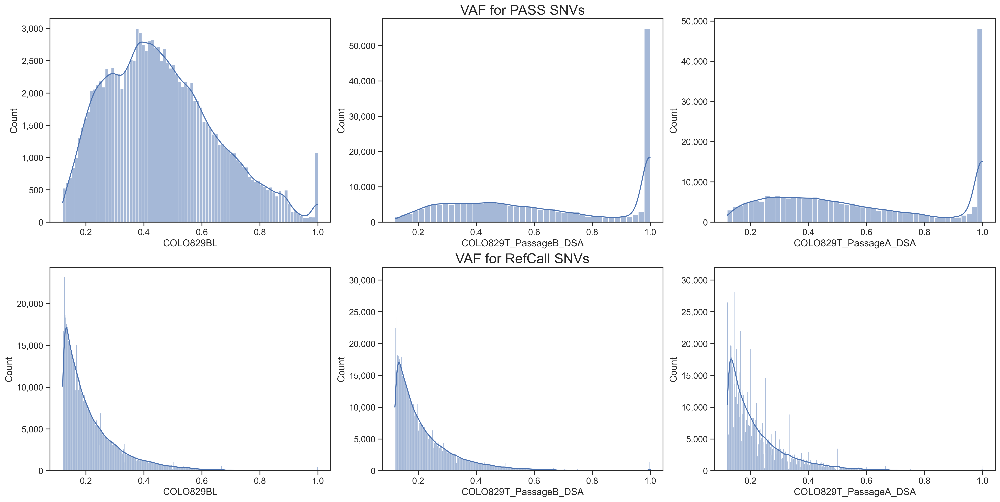

In [99]:
'''
stat
-count: show the number of observations in each bin
-frequency: show the number of observations divided by the bin width
-probability or proportion: normalize such that bar heights sum to 1
-percent: normalize such that bar heights sum to 100
-density: normalize such that the total area of the histogram equals 1
'''
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].set_ylim(0, 32000)
sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].set_ylim(0, 32000)

axes[0, 1].set_title('VAF for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('VAF for RefCall SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

print(f"Minimum VAF for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

'\nprint(f"Minimum DP for PASS SNVs in COLO829BL: {colobl_snvs_pass[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\n\nprint(f"Minimum DP for RefCall SNVs in COLO829BL: {colobl_snvs_refcall[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\nprint(f"Minimum DP for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[dpindex])).min()}")\n'

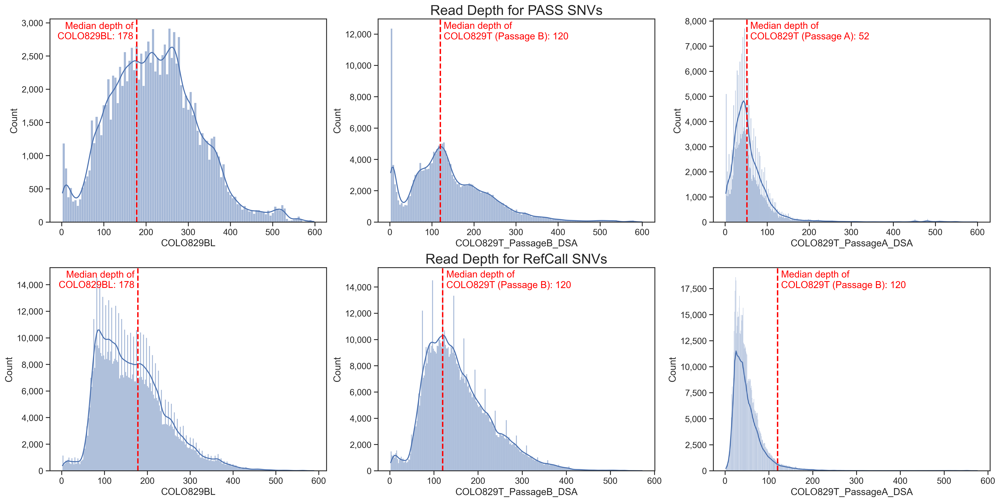

In [100]:
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,0].text(colobl_median_dp-8, axes[0,0].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,1].text(colotb_median_dp+8, axes[0,1].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,2].axvline(x=colota_median_dp, color='red', linestyle='--', linewidth=2)
axes[0,2].text(colota_median_dp+8, axes[0,2].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage A): {colota_median_dp}', color='red', ha='left')

sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,0].text(colobl_median_dp-8, axes[1,0].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,1].text(colotb_median_dp+8, axes[1,1].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].axvline(x=colotb_median_dp, color='red', linestyle='--', linewidth=2)
axes[1,2].text(colotb_median_dp+8, axes[1,2].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829T (Passage B): {colotb_median_dp}', color='red', ha='left')

axes[0, 1].set_title('Read Depth for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('Read Depth for RefCall SNVs', loc='center', fontsize=20)
'''
print(f"Minimum DP for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")

print(f"Minimum DP for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
print(f"Minimum DP for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[dpindex])).min()}")
'''

'\nprint(f"Minimum AD for PASS SNVs in COLO829BL: {colobl_snvs_pass[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass[\'COLO829T_PassageA_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\n\nprint(f"Minimum AD for RefCall SNVs in COLO829BL: {colobl_snvs_refcall[\'COLO829BL\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall[\'COLO829T_PassageB_DSA\'].str.split(\':\').apply(lambda x: int(x[adindex].split(\',\')[1])).min()}")\nprint(f"Minimum AD for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall[\'COLO829T_PassageA_DSA\'].str.split(\':\').appl

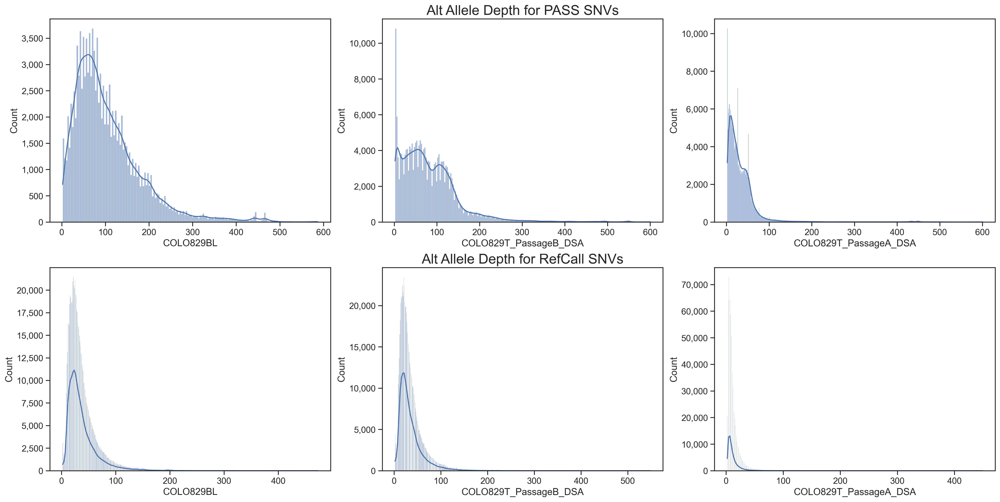

In [101]:
fig, axes = plt.subplots(2,3, figsize=(20,10), constrained_layout=True)
sns.histplot(colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,0])
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].set_rasterized(True)
sns.histplot(colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,1])
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].set_rasterized(True)
sns.histplot(colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[0,2])
axes[0,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,2].set_rasterized(True)

sns.histplot(colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), lw=0.2, kde=True, ax=axes[1,0])
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].set_rasterized(True)
sns.histplot(colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[1,1])
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].set_rasterized(True)
sns.histplot(colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), kde=True, ax=axes[1,2])
axes[1,2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,2].set_rasterized(True)

axes[0, 1].set_title('Alt Allele Depth for PASS SNVs', loc='center', fontsize=20)
axes[1, 1].set_title('Alt Allele Depth for RefCall SNVs', loc='center', fontsize=20)
'''
print(f"Minimum AD for PASS SNVs in COLO829BL: {colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")

print(f"Minimum AD for RefCall SNVs in COLO829BL: {colobl_snvs_refcall['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for RefCall SNVs  in COLO829T (Passage B): {colotb_snvs_refcall['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
print(f"Minimum AD for RefCall SNVs  in COLO829T (Passage A): {colota_snvs_refcall['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])).min()}")
'''

In [102]:
colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[dpindex])).sort_values()
colobl_snvs_pass.iloc[36712]
#print(colobl_snvs_pass.iloc[36712]['CHROM'] + ':' + str(colobl_snvs_pass.iloc[36712]['POS']))
#print(colobl_snvs_pass.iloc[45723]['CHROM'] + ':' + str(colobl_snvs_pass.iloc[45723]['POS']))

CHROM          haplotype1-0000027
POS                     153943469
ID                              .
REF                             A
ALT                             C
QUAL                           33
FILTER                       PASS
INFO                            .
FORMAT         GT:GQ:DP:AD:VAF:PL
COLO829BL    1/1:7:2:0,2:1:31,5,0
Name: 36712, dtype: object

In [103]:
'''
colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 1) &
    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 1 for alt in x.split(','))))
    ]

colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 1) &
    (colobl_vcf['ALT'].apply(lambda x: all(len(alt) == 1 for alt in x.split(','))))
    ]

colobl_vcf[
    (colobl_vcf['FILTER'] == 'PASS') &
    (colobl_vcf['REF'].str.len() == 2) &
    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 2 for alt in x.split(','))))
    ]
'''

"\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 1) &\n    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 1 for alt in x.split(','))))\n    ]\n\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 1) &\n    (colobl_vcf['ALT'].apply(lambda x: all(len(alt) == 1 for alt in x.split(','))))\n    ]\n\ncolobl_vcf[\n    (colobl_vcf['FILTER'] == 'PASS') &\n    (colobl_vcf['REF'].str.len() == 2) &\n    (colobl_vcf['ALT'].apply(lambda x: any(len(alt) == 2 for alt in x.split(','))))\n    ]\n"

## Final Filtering (w/ AD)

In [104]:
colobl_snvs_pass, colotb_snvs_pass, colota_snvs_pass

(                     CHROM      POS ID REF ALT  QUAL FILTER INFO  \
 0       haplotype1-0000001   119793  .   T   G  48.2   PASS    .   
 1       haplotype1-0000001  2005081  .   T   A   8.8   PASS    .   
 2       haplotype1-0000001  3266005  .   G   T  29.8   PASS    .   
 3       haplotype1-0000001  4855815  .   A   C  30.2   PASS    .   
 4       haplotype1-0000001  6364498  .   A   G  45.1   PASS    .   
 ...                    ...      ... ..  ..  ..   ...    ...  ...   
 124026  haplotype2-0000195    23029  .   C   T   7.4   PASS    .   
 124027  haplotype2-0000195    23040  .   C   T  11.4   PASS    .   
 124028  haplotype2-0000195    23141  .   A   G  14.8   PASS    .   
 124029  haplotype2-0000195    23237  .   A   G  11.4   PASS    .   
 124030  haplotype2-0000195    23256  .   G   A  18.1   PASS    .   
 
                     FORMAT                           COLO829BL  
 0       GT:GQ:DP:AD:VAF:PL   0/1:46:190:87,96:0.505263:48,0,51  
 1       GT:GQ:DP:AD:VAF:PL     0/1:9:

In [105]:
'''
print('COLO829BL SNV Before AD filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD filtering : ', f'{colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')
print('COLO829T Passage B SNV Before AD filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD filtering: ', f'{colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')
print('COLO829T Passage A SNV Before AD filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD filtering: ', f'{colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].shape[0]:,}')
'''
colobl_snvs_pass_ad10 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)
colotb_snvs_pass_ad10 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)
colota_snvs_pass_ad10 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 10 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥10 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥10 filtering : ', f'{colobl_snvs_pass_ad10.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥10 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥10 filtering: ', f'{colotb_snvs_pass_ad10.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥10 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥10 filtering: ', f'{colota_snvs_pass_ad10.shape[0]:,}')

COLO829BL SNV Before AD≥10 filtering:  124,031
COLO829BL SNV After  AD≥10 filtering :  121,222
COLO829T Passage B SNV Before AD≥10 filtering:  205,113
COLO829T Passage B SNV After  AD≥10 filtering:  185,811
COLO829T Passage A SNV Before AD≥10 filtering:  230,756
COLO829T Passage A SNV After  AD≥10 filtering:  185,720


In [106]:
colobl_snvs_pass_ad30 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)
colotb_snvs_pass_ad30 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)
colota_snvs_pass_ad30 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 30 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥30 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥30 filtering : ', f'{colobl_snvs_pass_ad30.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥30 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥30 filtering: ', f'{colotb_snvs_pass_ad30.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥30 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥30 filtering: ', f'{colota_snvs_pass_ad30.shape[0]:,}')

COLO829BL SNV Before AD≥30 filtering:  124,031
COLO829BL SNV After  AD≥30 filtering :  110,694
COLO829T Passage B SNV Before AD≥30 filtering:  205,113
COLO829T Passage B SNV After  AD≥30 filtering:  160,586
COLO829T Passage A SNV Before AD≥30 filtering:  230,756
COLO829T Passage A SNV After  AD≥30 filtering:  98,246


In [107]:
colobl_snvs_pass_ad50 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)
colotb_snvs_pass_ad50 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)
colota_snvs_pass_ad50 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 50 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥50 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥50 filtering : ', f'{colobl_snvs_pass_ad50.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥50 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥50 filtering: ', f'{colotb_snvs_pass_ad50.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥50 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥50 filtering: ', f'{colota_snvs_pass_ad50.shape[0]:,}')

COLO829BL SNV Before AD≥50 filtering:  124,031
COLO829BL SNV After  AD≥50 filtering :  94,020
COLO829T Passage B SNV Before AD≥50 filtering:  205,113
COLO829T Passage B SNV After  AD≥50 filtering:  132,308
COLO829T Passage A SNV Before AD≥50 filtering:  230,756
COLO829T Passage A SNV After  AD≥50 filtering:  43,870


In [108]:
colobl_snvs_pass_ad80 = colobl_snvs_pass[( colobl_snvs_pass['COLO829BL'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)
colotb_snvs_pass_ad80 = colotb_snvs_pass[( colotb_snvs_pass['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)
colota_snvs_pass_ad80 = colota_snvs_pass[( colota_snvs_pass['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])) >= 80 )].reset_index(drop=True)

print('COLO829BL SNV Before AD≥80 filtering: ', f'{colobl_snvs_pass.shape[0]:,}')
print('COLO829BL SNV After  AD≥80 filtering : ', f'{colobl_snvs_pass_ad80.shape[0]:,}')
print('COLO829T Passage B SNV Before AD≥80 filtering: ', f'{colotb_snvs_pass.shape[0]:,}')
print('COLO829T Passage B SNV After  AD≥80 filtering: ', f'{colotb_snvs_pass_ad80.shape[0]:,}')
print('COLO829T Passage A SNV Before AD≥80 filtering: ', f'{colota_snvs_pass.shape[0]:,}')
print('COLO829T Passage A SNV After  AD≥80 filtering: ', f'{colota_snvs_pass_ad80.shape[0]:,}')

COLO829BL SNV Before AD≥80 filtering:  124,031
COLO829BL SNV After  AD≥80 filtering :  67,277
COLO829T Passage B SNV Before AD≥80 filtering:  205,113
COLO829T Passage B SNV After  AD≥80 filtering:  90,159
COLO829T Passage A SNV Before AD≥80 filtering:  230,756
COLO829T Passage A SNV After  AD≥80 filtering:  11,681


Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.12


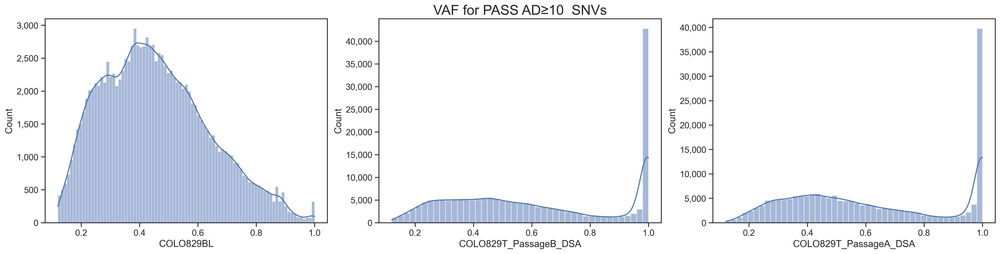

In [109]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad10['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad10['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥10  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad10['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad10['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad10['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

Minimum VAF for PASS SNVs in COLO829BL: 0.12
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.120112
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.120301


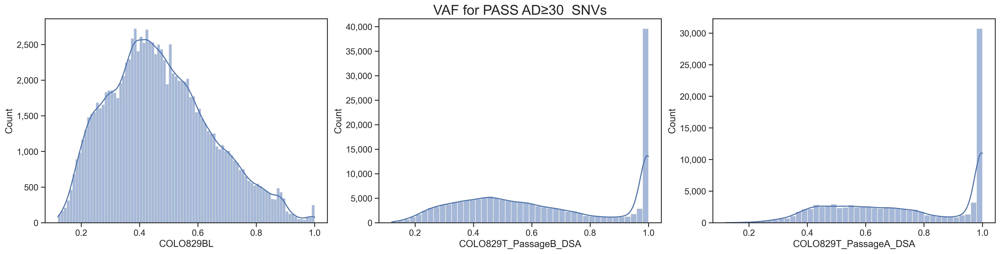

In [110]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad30['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad30['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad30['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥30  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad30['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad30['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad30['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

Minimum VAF for PASS SNVs in COLO829BL: 0.120567
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.121655
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.120301


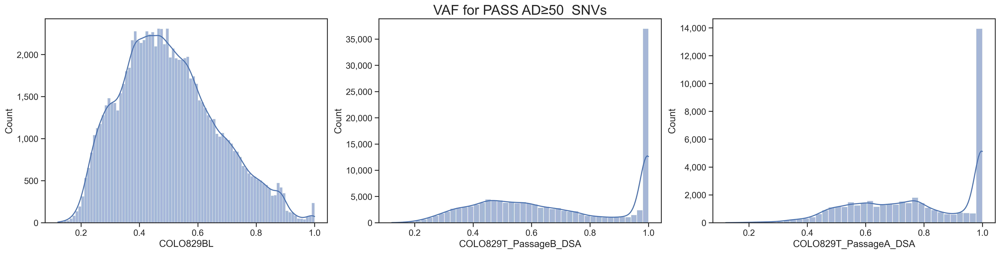

In [111]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad50['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad50['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad50['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥50  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad50['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad50['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad50['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

Minimum VAF for PASS SNVs in COLO829BL: 0.152174
Minimum VAF for PASS SNVs  in COLO829T (Passage B): 0.160396
Minimum VAF for PASS SNVs  in COLO829T (Passage A): 0.158397


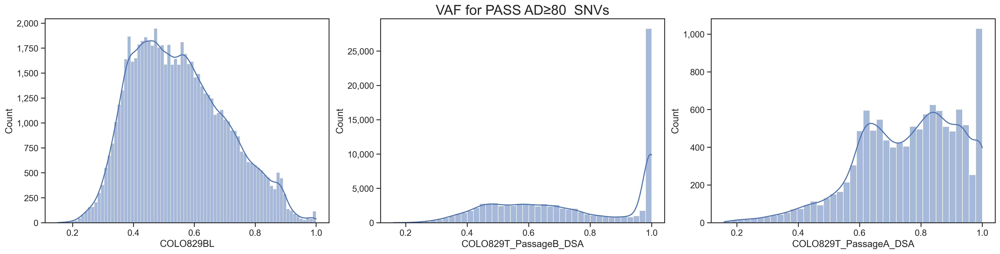

In [112]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad80['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colotb_snvs_pass_ad80['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(colota_snvs_pass_ad80['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), kde=True, ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

axes[1].set_title('VAF for PASS AD≥80  SNVs', loc='center', fontsize=20)

print(f"Minimum VAF for PASS SNVs in COLO829BL: {colobl_snvs_pass_ad80['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage B): {colotb_snvs_pass_ad80['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")
print(f"Minimum VAF for PASS SNVs  in COLO829T (Passage A): {colota_snvs_pass_ad80['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])).min()}")

## Flagger/NucFreq-based Filtering

In [113]:
colobl_snvs_pass['SNVid'] = colobl_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colobl_snvs_pass_ad10['SNVid'] = colobl_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colobl_snvs_pass_ad30['SNVid'] = colobl_snvs_pass_ad30[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colobl_snvs_pass_ad50['SNVid'] = colobl_snvs_pass_ad50[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colobl_snvs_pass_ad80['SNVid'] = colobl_snvs_pass_ad50[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colotb_snvs_pass_ad10['SNVid'] = colotb_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colota_snvs_pass_ad10['SNVid'] = colota_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

colotb_snvs_pass['SNVid'] = colotb_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
colota_snvs_pass['SNVid'] = colota_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

In [114]:
colobl_snvs_pass

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829BL,SNVid
0,haplotype1-0000001,119793,.,T,G,48.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:46:190:87,96:0.505263:48,0,51",haplotype1-0000001_119793_T_G
1,haplotype1-0000001,2005081,.,T,A,8.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:9:123:68,55:0.447154:8,0,27",haplotype1-0000001_2005081_T_A
2,haplotype1-0000001,3266005,.,G,T,29.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:30:175:107,68:0.388571:29,0,52",haplotype1-0000001_3266005_G_T
3,haplotype1-0000001,4855815,.,A,C,30.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:2:142:49,72:0.507042:26,13,1",haplotype1-0000001_4855815_A_C
4,haplotype1-0000001,6364498,.,A,G,45.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:45:200:105,94:0.47:45,0,57",haplotype1-0000001_6364498_A_G
...,...,...,...,...,...,...,...,...,...,...,...
124026,haplotype2-0000195,23029,.,C,T,7.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:7:56:48,8:0.142857:6,0,42",haplotype2-0000195_23029_C_T
124027,haplotype2-0000195,23040,.,C,T,11.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:11:56:48,8:0.142857:11,0,44",haplotype2-0000195_23040_C_T
124028,haplotype2-0000195,23141,.,A,G,14.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:15:55:47,8:0.145455:14,0,44",haplotype2-0000195_23141_A_G
124029,haplotype2-0000195,23237,.,A,G,11.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:11:55:47,8:0.145455:11,0,42",haplotype2-0000195_23237_A_G


### Mark Flagger, NucFreq annotation to vcf

In [115]:
temp_annotated_colobl_snvs_pass = pd.merge(colobl_snvs_pass, colobl_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colobl_snvs_pass_annot = pd.merge(temp_annotated_colobl_snvs_pass, colobl_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colobl_snvs_pass_ad10 = pd.merge(colobl_snvs_pass_ad10, colobl_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colobl_snvs_pass_ad10_annot = pd.merge(temp_annotated_colobl_snvs_pass_ad10, colobl_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colotb_snvs_pass = pd.merge(colotb_snvs_pass, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colotb_snvs_pass_annot = pd.merge(temp_annotated_colotb_snvs_pass, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colotb_snvs_pass_ad10 = pd.merge(colotb_snvs_pass_ad10, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colotb_snvs_pass_ad10_annot = pd.merge(temp_annotated_colotb_snvs_pass_ad10, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colota_snvs_pass = pd.merge(colota_snvs_pass, colota_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colota_snvs_pass_annot = pd.merge(temp_annotated_colota_snvs_pass, colota_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

temp_annotated_colota_snvs_pass_ad10 = pd.merge(colota_snvs_pass_ad10, colota_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')
colota_snvs_pass_ad10_annot = pd.merge(temp_annotated_colota_snvs_pass_ad10, colota_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')

del temp_annotated_colobl_snvs_pass, temp_annotated_colobl_snvs_pass_ad10, temp_annotated_colotb_snvs_pass, temp_annotated_colotb_snvs_pass_ad10, temp_annotated_colota_snvs_pass, temp_annotated_colota_snvs_pass_ad10

In [116]:
colobl_snvs_pass_annot['Flagger'].value_counts()

Flagger
Hap    103001
Err      9776
Dup      8650
Col      2441
Unk       163
Name: count, dtype: int64

In [117]:
colobl_snvs_pass_ad10_annot['Flagger'].value_counts()

Flagger
Hap    102729
Dup      8398
Err      7497
Col      2441
Unk       157
Name: count, dtype: int64

In [118]:
colobl_snvs_pass_ad10_annot['NucFreq'].value_counts()

NucFreq
misassembly    360
collapse       324
Name: count, dtype: int64

In [119]:
colotb_snvs_pass_annot['Flagger'].value_counts()

Flagger
Hap    182127
Dup     10259
Err     10189
Col      2383
Unk       155
Name: count, dtype: int64

## COLO829BL wo/ AD filtering (PASS)

### VAF histogram according to Flagger annotation

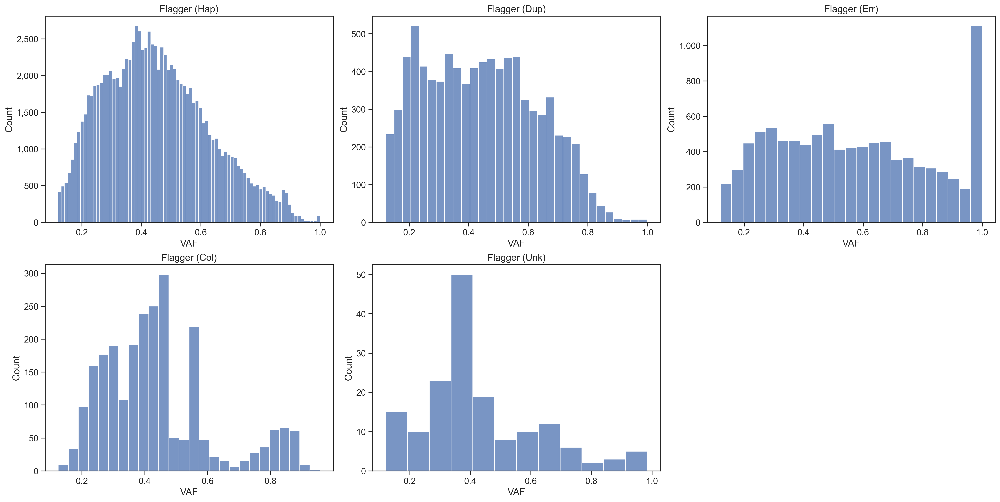

In [120]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

# Create the subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

# Loop through the categories and create the histograms
for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_annot[colobl_snvs_pass_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('VAF')

# Remove the last subplot (axes[1,2])
fig.delaxes(axes[1, 2])

### DP histogram according to NucFreq annotation

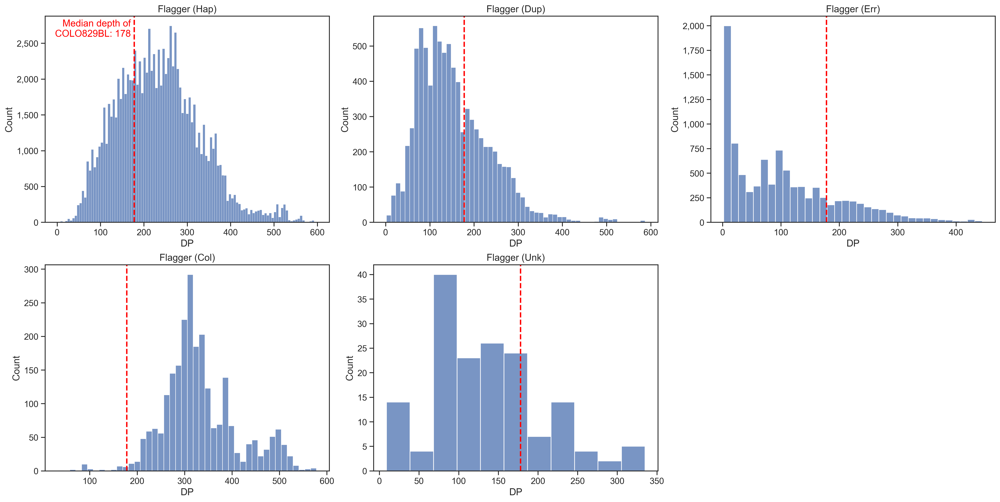

In [121]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_annot[colobl_snvs_pass_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('DP')
    axes[row, col].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    if category == 'Hap':
        axes[row, col].text(170, axes[row, col].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

fig.delaxes(axes[1, 2])

### VAF histogram according to NucFreq annotation

/tmp/ipykernel_817622/1723839000.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
/tmp/ipykernel_817622/1723839000.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
/tmp/ipykernel_817622/1723839000.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])


Text(0.5, 0, 'VAF')

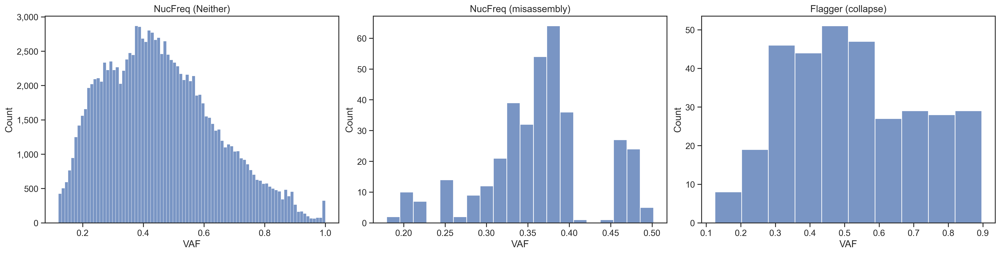

In [122]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_title('NucFreq (Neither)')
axes[0].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_title('NucFreq (misassembly)')
axes[1].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[2].set_title('Flagger (collapse)')
axes[2].set_xlabel('VAF')

### DP histogram according to NucFreq annotation

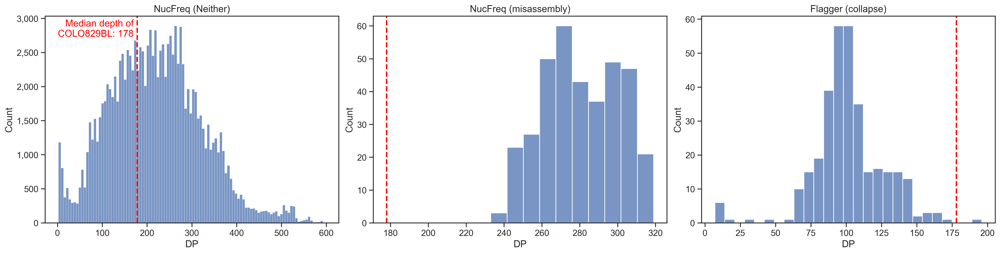

In [123]:
categories = [None, 'misassembly', 'collapse']
titles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']

fig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    if category is None:
        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'].isna()]['COLO829BL']
    else:
        data = colobl_snvs_pass_annot[colobl_snvs_pass_annot['NucFreq'] == category]['COLO829BL']
    
    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])
    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[i].set_title(title)
    axes[i].set_xlabel('DP')
    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    
    if category is None:
        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')


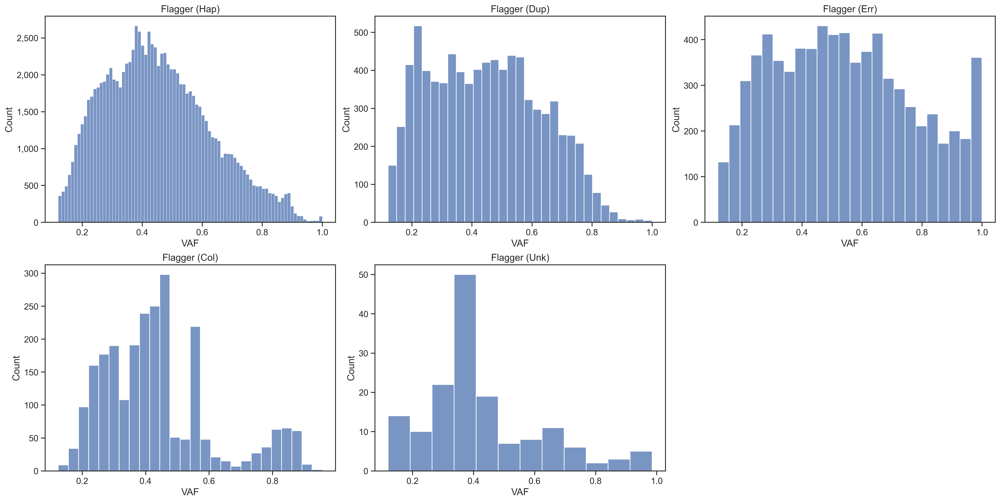

In [124]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

# Create the subplots
fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

# Loop through the categories and create the histograms
for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('VAF')

# Remove the last subplot (axes[1,2])
fig.delaxes(axes[1, 2])

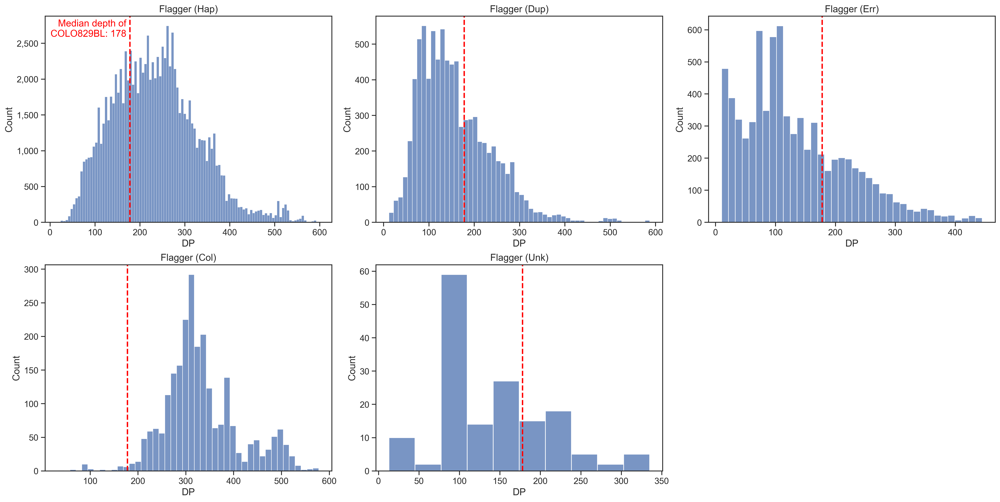

In [125]:
categories = ['Hap', 'Dup', 'Err', 'Col', 'Unk']
titles = ['Flagger (Hap)', 'Flagger (Dup)', 'Flagger (Err)', 'Flagger (Col)', 'Flagger (Unk)']

fig, axes = plt.subplots(2, 3, figsize=(20, 10), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    row, col = divmod(i, 3)
    sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['Flagger'] == category]['COLO829BL']
                 .str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[row, col])
    axes[row, col].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[row, col].set_title(title)
    axes[row, col].set_xlabel('DP')
    axes[row, col].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    if category == 'Hap':
        axes[row, col].text(170, axes[row, col].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')

fig.delaxes(axes[1, 2])

Text(0.5, 0, 'VAF')

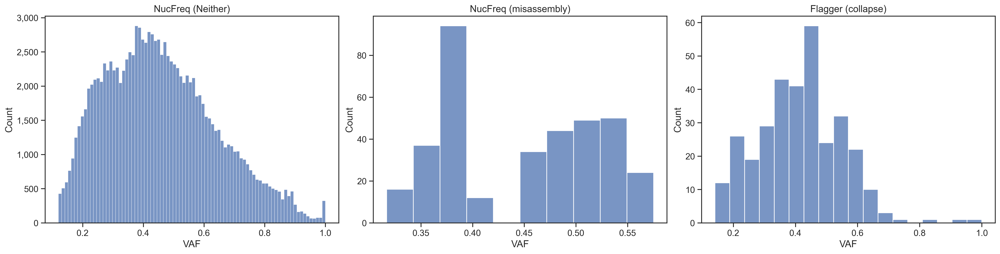

In [126]:
fig, axes = plt.subplots(1,3, figsize=(20,5), constrained_layout=True)
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_title('NucFreq (Neither)')
axes[0].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'misassembly']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_title('NucFreq (misassembly)')
axes[1].set_xlabel('VAF')
sns.histplot(colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == 'collapse']['COLO829BL'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[2])
axes[2].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[2].set_title('Flagger (collapse)')
axes[2].set_xlabel('VAF')

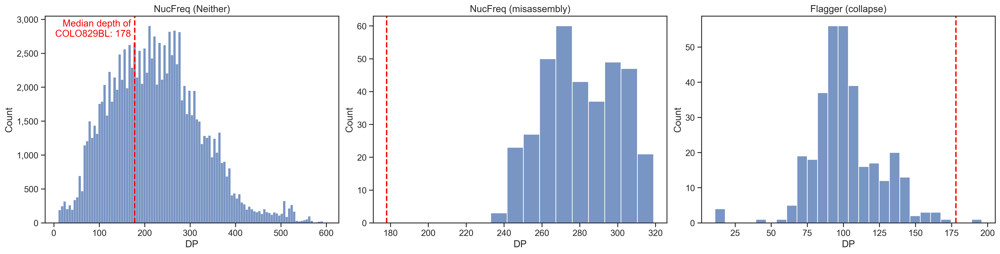

In [127]:
categories = [None, 'misassembly', 'collapse']
titles = ['NucFreq (Neither)', 'NucFreq (misassembly)', 'Flagger (collapse)']

fig, axes = plt.subplots(1, 3, figsize=(20, 5), constrained_layout=True)

for i, (category, title) in enumerate(zip(categories, titles)):
    if category is None:
        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'].isna()]['COLO829BL']
    else:
        data = colobl_snvs_pass_ad10_annot[colobl_snvs_pass_ad10_annot['NucFreq'] == category]['COLO829BL']
    
    sns.histplot(data.str.split(':').apply(lambda x: int(x[dpindex])), ax=axes[i])
    axes[i].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
    axes[i].set_title(title)
    axes[i].set_xlabel('DP')
    axes[i].axvline(x=colobl_median_dp, color='red', linestyle='--', linewidth=2)
    
    if category is None:
        axes[i].text(170, axes[i].get_ylim()[1] * 0.9, f'Median depth of\nCOLO829BL: {colobl_median_dp}', color='red', ha='right')


In [128]:
colotb_snvs_pass

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid
0,haplotype1-0000001,345669,.,C,T,65,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:133:2,131:0.984962:65,60,0",haplotype1-0000001_345669_C_T
1,haplotype1-0000001,381602,.,G,T,70.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:131:0,131:1:70,66,0",haplotype1-0000001_381602_G_T
2,haplotype1-0000001,436345,.,G,A,58.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:53:49:0,49:1:58,54,0",haplotype1-0000001_436345_G_A
3,haplotype1-0000001,493800,.,G,A,68.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:63:83:0,83:1:68,63,0",haplotype1-0000001_493800_G_A
4,haplotype1-0000001,547974,.,A,G,71.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:123:0,123:1:71,66,0",haplotype1-0000001_547974_A_G
...,...,...,...,...,...,...,...,...,...,...,...
205108,haplotype2-0000194,48714,.,T,C,46.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:21:20:0,20:1:46,21,0",haplotype2-0000194_48714_T_C
205109,haplotype2-0000194,49083,.,G,C,48,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:20:19:0,19:1:47,20,0",haplotype2-0000194_49083_G_C
205110,haplotype2-0000194,52592,.,A,G,53,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:31:10:0,10:1:52,30,0",haplotype2-0000194_52592_A_G
205111,haplotype2-0000194,52823,.,C,G,51.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:29:10:0,10:1:51,29,0",haplotype2-0000194_52823_C_G


## Comparison btw Passage B and Passage A

In [129]:
colobl_snvs_pass_set = set(colobl_snvs_pass['SNVid'].values)
colobl_snvs_pass_ad10_set = set(colobl_snvs_pass_ad10['SNVid'].values)
colobl_snvs_pass_ad30_set = set(colobl_snvs_pass_ad30['SNVid'].values)
colobl_snvs_pass_ad50_set = set(colobl_snvs_pass_ad50['SNVid'].values)
colobl_snvs_pass_ad80_set = set(colobl_snvs_pass_ad80['SNVid'].values)

colotb_snvs_pass_set = set(colotb_snvs_pass['SNVid'].values)
colotb_snvs_pass_ad10_set = set(colotb_snvs_pass_ad10['SNVid'].values)

colota_snvs_pass_set = set(colota_snvs_pass['SNVid'].values)
colota_snvs_pass_ad10_set = set(colota_snvs_pass_ad10['SNVid'].values)

In [130]:
"""
total = len(colotb_snvs_pass_set.union(colobl_snvs_pass_set))
venn = venn2([colotb_snvs_pass_set, colobl_snvs_pass_set], 
             ('Passage B', 'COLO829BL'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
"""

'\ntotal = len(colotb_snvs_pass_set.union(colobl_snvs_pass_set))\nvenn = venn2([colotb_snvs_pass_set, colobl_snvs_pass_set], \n             (\'Passage B\', \'COLO829BL\'),\n             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")\n'

In [131]:
sns.set_theme(font="Arial", font_scale=1.00, style='ticks')
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=False, right=False)

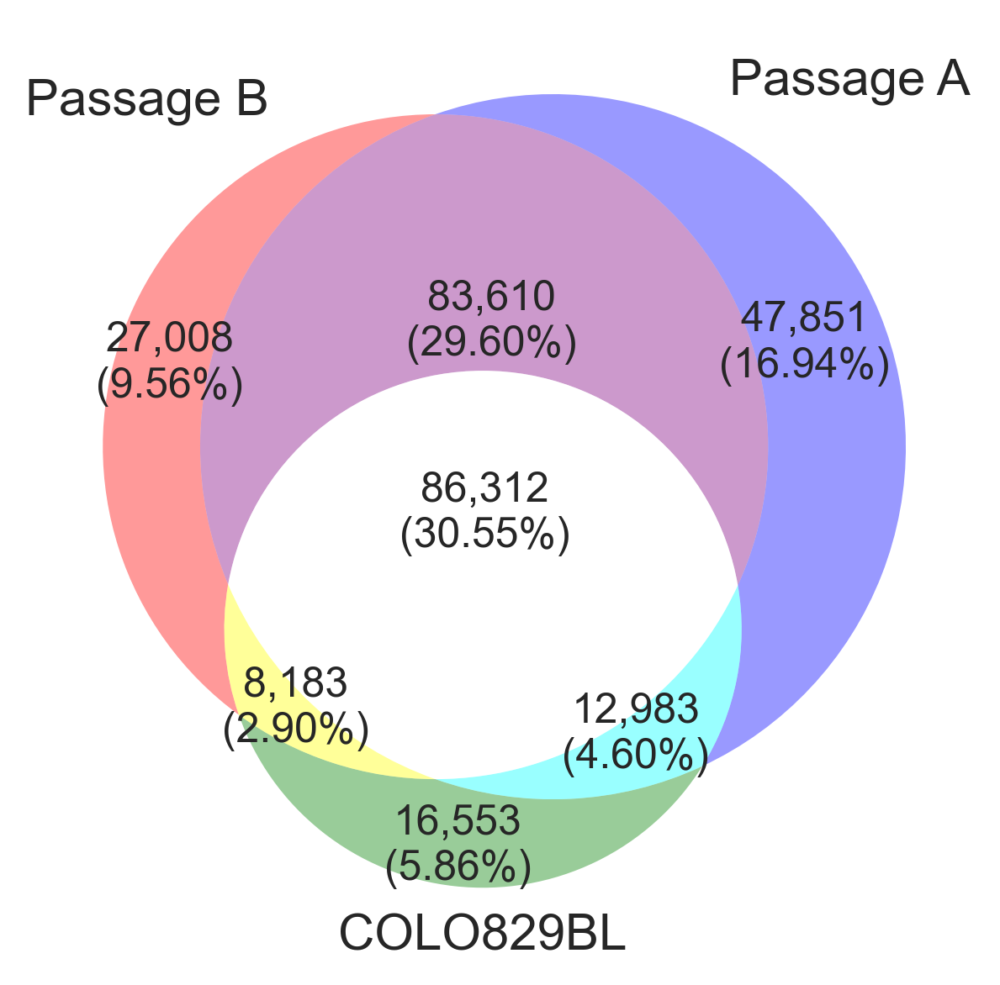

In [132]:
total = len((colotb_snvs_pass_set.union(colota_snvs_pass_set)).union(colobl_snvs_pass_set))
venn = venn3([colotb_snvs_pass_set, colota_snvs_pass_set, colobl_snvs_pass_set], 
             ('Passage B', 'Passage A', 'COLO829BL'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
venn.get_patch_by_id('100').set_color('red')
venn.get_patch_by_id('010').set_color('blue')
venn.get_patch_by_id('001').set_color('green')
venn.get_patch_by_id('110').set_color('purple')
venn.get_patch_by_id('101').set_color('yellow')
venn.get_patch_by_id('011').set_color('cyan')
venn.get_patch_by_id('111').set_color('white')


for i in ['100', '010', '001', '110', '101', '011', '111']:
    venn.get_patch_by_id(i).set_edgecolor('none')
    venn.get_patch_by_id(i).set_alpha(0.4)

In [133]:
tb_glfilt_onlytb_set = colotb_snvs_pass_set.difference(colota_snvs_pass_set).difference(colobl_snvs_pass_set)
ta_glfilt_onlyta_set = colota_snvs_pass_set.difference(colotb_snvs_pass_set).difference(colobl_snvs_pass_set)
tba_glfilt_tba_set = colotb_snvs_pass_set.difference(colobl_snvs_pass_set).intersection(colota_snvs_pass_set.difference(colobl_snvs_pass_set))

colot_glfilt_set = tb_glfilt_onlytb_set.union(ta_glfilt_onlyta_set).union(tba_glfilt_tba_set)
print(f'{len(tb_glfilt_onlytb_set):,}')
print(f'{len(ta_glfilt_onlyta_set):,}')
print(f'{len(tba_glfilt_tba_set):,}')
print(f'{len(colot_glfilt_set):,}')

27,008
47,851
83,610
158,469


In [134]:
colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tb_glfilt_onlytb_set)]['Flagger'].value_counts()

Flagger
Hap    23521
Err     1857
Dup     1549
Col       69
Unk       12
Name: count, dtype: int64

In [135]:
colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(ta_glfilt_onlyta_set)]['Flagger'].value_counts()

Flagger
Hap    41964
Dup     3122
Err     2500
Col      204
Unk       61
Name: count, dtype: int64

In [136]:
print("These two should be the same")
print(colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts())
print(colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts())

These two should be the same
Flagger
Hap    79470
Dup     2453
Err     1523
Col      142
Unk       22
Name: count, dtype: int64
Flagger
Hap    79470
Dup     2453
Err     1523
Col      142
Unk       22
Name: count, dtype: int64


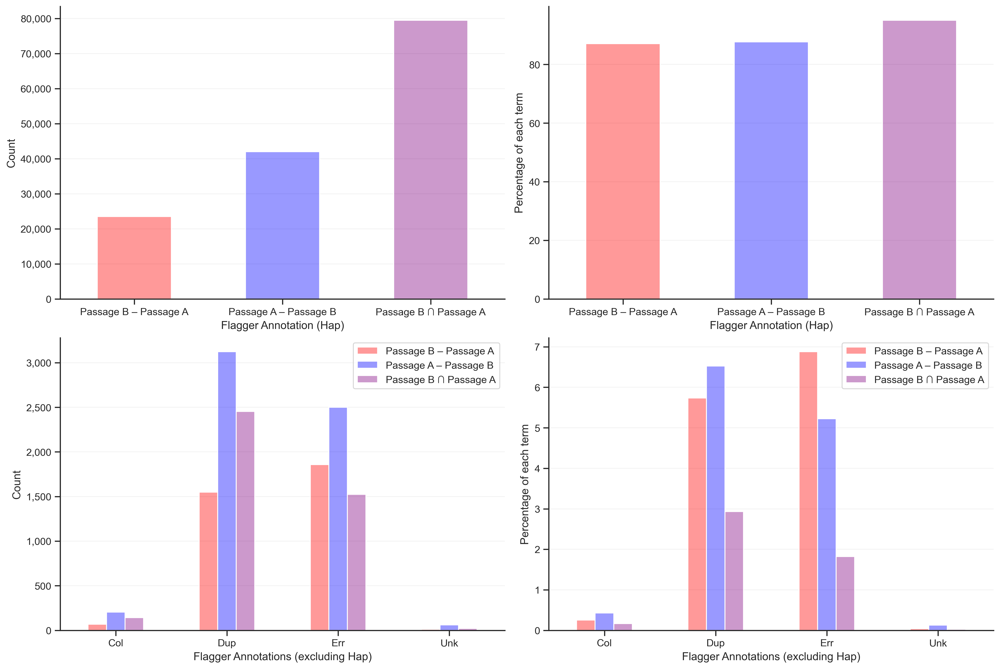

In [137]:
df_counts = pd.DataFrame({'Passage B – Passage A': colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tb_glfilt_onlytb_set)]['Flagger'].value_counts(), 
                          'Passage A – Passage B': colota_snvs_pass_annot[colota_snvs_pass_annot['SNVid'].isin(ta_glfilt_onlyta_set)]['Flagger'].value_counts(), 
                          'Passage B ∩ Passage A': colotb_snvs_pass_annot[colotb_snvs_pass_annot['SNVid'].isin(tba_glfilt_tba_set)]['Flagger'].value_counts()})
df_proportions = df_counts.div(df_counts.sum(axis=0), axis=1)*100

colors = {
    'Passage B – Passage A': (1, 0, 0, 0.4),
    'Passage A – Passage B': (0, 0, 1, 0.4),
    'Passage B ∩ Passage A': (0.5, 0, 0.5, 0.4)
}

fig, axes = plt.subplots(2, 2, figsize=(15, 10), constrained_layout=True)

df_counts.loc['Hap'].plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[0,0]).grid(axis='y', zorder=0, alpha=0.2)
axes[0,0].set_xlabel('Flagger Annotation (Hap)')
axes[0,0].set_ylabel('Count')
axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,0].tick_params(axis='x', rotation=0)
df_proportions.loc['Hap'].plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[0,1]).grid(axis='y', zorder=0, alpha=0.2)
axes[0,1].set_xlabel('Flagger Annotation (Hap)')
axes[0,1].set_ylabel('Percentage of each term')
axes[0,1].tick_params(axis='x', rotation=0)

df_counts.drop('Hap').plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[1,0]).grid(axis='y', zorder=0, alpha=0.2)
axes[1,0].set_xlabel('Flagger Annotations (excluding Hap)')
axes[1,0].set_ylabel('Count')
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].tick_params(axis='x', rotation=0)
df_proportions.drop('Hap').plot(kind='bar', width=0.5, color=[colors[col] for col in df_counts.columns], ax=axes[1,1]).grid(axis='y', zorder=0, alpha=0.2)
axes[1,1].set_xlabel('Flagger Annotations (excluding Hap)')
axes[1,1].set_ylabel('Percentage of each term')
axes[1,1].tick_params(axis='x', rotation=0)

In [138]:
"""
fig, axes = plt.subplots(1,2, figsize=(15,5), constrained_layout=True)
sns.histplot(colotb_snvs_pass_ad10_BiAcomp['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0].set_ylim(0, 3000)
sns.histplot(colota_snvs_pass_ad10_BiAcomp['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1].set_ylim(0, 3000)
"""

"\nfig, axes = plt.subplots(1,2, figsize=(15,5), constrained_layout=True)\nsns.histplot(colotb_snvs_pass_ad10_BiAcomp['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[0])\naxes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[0].set_ylim(0, 3000)\nsns.histplot(colota_snvs_pass_ad10_BiAcomp['COLO829T_PassageA_DSA'].str.split(':').apply(lambda x: float(x[vafindex])), ax=axes[1])\naxes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))\naxes[1].set_ylim(0, 3000)\n"

# Test

In [139]:
colobl_snvs_pass_ad10

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829BL,SNVid
0,haplotype1-0000001,119793,.,T,G,48.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:46:190:87,96:0.505263:48,0,51",haplotype1-0000001_119793_T_G
1,haplotype1-0000001,2005081,.,T,A,8.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:9:123:68,55:0.447154:8,0,27",haplotype1-0000001_2005081_T_A
2,haplotype1-0000001,3266005,.,G,T,29.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:30:175:107,68:0.388571:29,0,52",haplotype1-0000001_3266005_G_T
3,haplotype1-0000001,4855815,.,A,C,30.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:2:142:49,72:0.507042:26,13,1",haplotype1-0000001_4855815_A_C
4,haplotype1-0000001,6364498,.,A,G,45.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:45:200:105,94:0.47:45,0,57",haplotype1-0000001_6364498_A_G
...,...,...,...,...,...,...,...,...,...,...,...
121217,haplotype2-0000190,18491,.,G,T,7.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:7:35:17,18:0.514286:6,0,34",haplotype2-0000190_18491_G_T
121218,haplotype2-0000190,18640,.,A,T,29.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:29:35:17,17:0.485714:29,0,47",haplotype2-0000190_18640_A_T
121219,haplotype2-0000190,18662,.,A,G,22.9,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:23:34:16,18:0.529412:22,0,43",haplotype2-0000190_18662_A_G
121220,haplotype2-0000190,18775,.,C,T,19.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:19:33:16,17:0.515152:19,0,41",haplotype2-0000190_18775_C_T


In [140]:
colobl_snvs_pass_ad10['SNVid'] = colobl_snvs_pass_ad10[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)

colobl_snvs_pass_ad10

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829BL,SNVid
0,haplotype1-0000001,119793,.,T,G,48.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:46:190:87,96:0.505263:48,0,51",haplotype1-0000001_119793_T_G
1,haplotype1-0000001,2005081,.,T,A,8.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:9:123:68,55:0.447154:8,0,27",haplotype1-0000001_2005081_T_A
2,haplotype1-0000001,3266005,.,G,T,29.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:30:175:107,68:0.388571:29,0,52",haplotype1-0000001_3266005_G_T
3,haplotype1-0000001,4855815,.,A,C,30.2,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:2:142:49,72:0.507042:26,13,1",haplotype1-0000001_4855815_A_C
4,haplotype1-0000001,6364498,.,A,G,45.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:45:200:105,94:0.47:45,0,57",haplotype1-0000001_6364498_A_G
...,...,...,...,...,...,...,...,...,...,...,...
121217,haplotype2-0000190,18491,.,G,T,7.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:7:35:17,18:0.514286:6,0,34",haplotype2-0000190_18491_G_T
121218,haplotype2-0000190,18640,.,A,T,29.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:29:35:17,17:0.485714:29,0,47",haplotype2-0000190_18640_A_T
121219,haplotype2-0000190,18662,.,A,G,22.9,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:23:34:16,18:0.529412:22,0,43",haplotype2-0000190_18662_A_G
121220,haplotype2-0000190,18775,.,C,T,19.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:19:33:16,17:0.515152:19,0,41",haplotype2-0000190_18775_C_T


In [141]:
colotb_snvs_pass['SNVid'] = colotb_snvs_pass[['CHROM', 'POS', 'REF', 'ALT']].astype(str).apply('_'.join, axis=1)
temp_annotated_colotb_snvs_pass = pd.merge(colotb_snvs_pass, colotb_flagger[['SNVid', 'Flagger']], on='SNVid', how='left')

colotb_snvs_pass_annot = pd.merge(temp_annotated_colotb_snvs_pass, colotb_nucfreq[['SNVid', 'NucFreq']], on='SNVid', how='left')



colotb_snvs_pass_annot

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq
0,haplotype1-0000001,345669,.,C,T,65,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:133:2,131:0.984962:65,60,0",haplotype1-0000001_345669_C_T,Hap,NaN
1,haplotype1-0000001,381602,.,G,T,70.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:131:0,131:1:70,66,0",haplotype1-0000001_381602_G_T,Hap,NaN
2,haplotype1-0000001,436345,.,G,A,58.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:53:49:0,49:1:58,54,0",haplotype1-0000001_436345_G_A,Hap,NaN
3,haplotype1-0000001,493800,.,G,A,68.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:63:83:0,83:1:68,63,0",haplotype1-0000001_493800_G_A,Hap,NaN
4,haplotype1-0000001,547974,.,A,G,71.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:123:0,123:1:71,66,0",haplotype1-0000001_547974_A_G,Hap,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,haplotype2-0000194,48714,.,T,C,46.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:21:20:0,20:1:46,21,0",haplotype2-0000194_48714_T_C,Dup,NaN
205109,haplotype2-0000194,49083,.,G,C,48,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:20:19:0,19:1:47,20,0",haplotype2-0000194_49083_G_C,Dup,NaN
205110,haplotype2-0000194,52592,.,A,G,53,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:31:10:0,10:1:52,30,0",haplotype2-0000194_52592_A_G,Dup,NaN
205111,haplotype2-0000194,52823,.,C,G,51.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:29:10:0,10:1:51,29,0",haplotype2-0000194_52823_C_G,Dup,NaN


In [142]:
colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).value_counts()

SNVid
False    111871
True      93242
Name: count, dtype: int64

In [143]:
colotb_snvs_pass_annot['COLO829BL_Germline_ad10'] = colotb_snvs_pass_annot['SNVid'].isin(colobl_snvs_pass_ad10['SNVid']).map({True: 'Yes', False: 'No'})

In [144]:
test1 = pd.concat([colotb_snvs_pass_annot['SNVid'], colotb_snvs_pass_annot['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), colotb_snvs_pass_annot['Flagger']], axis=1)

In [145]:
bins = list(range(0, 302, 10)) + [test1['COLO829T_PassageB_DSA'].max() + 1]
test1['Range'] = pd.cut(test1['COLO829T_PassageB_DSA'], bins=bins)
test1

,SNVid,COLO829T_PassageB_DSA,Flagger,Range
0,haplotype1-0000001_345669_C_T,131,Hap,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,Hap,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,Hap,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,Hap,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,Hap,"(120, 130]"
...,...,...,...,...
205108,haplotype2-0000194_48714_T_C,20,Dup,"(10, 20]"
205109,haplotype2-0000194_49083_G_C,19,Dup,"(10, 20]"
205110,haplotype2-0000194_52592_A_G,10,Dup,"(0, 10]"
205111,haplotype2-0000194_52823_C_G,10,Dup,"(0, 10]"


/tmp/ipykernel_817622/2574825411.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Flagger')

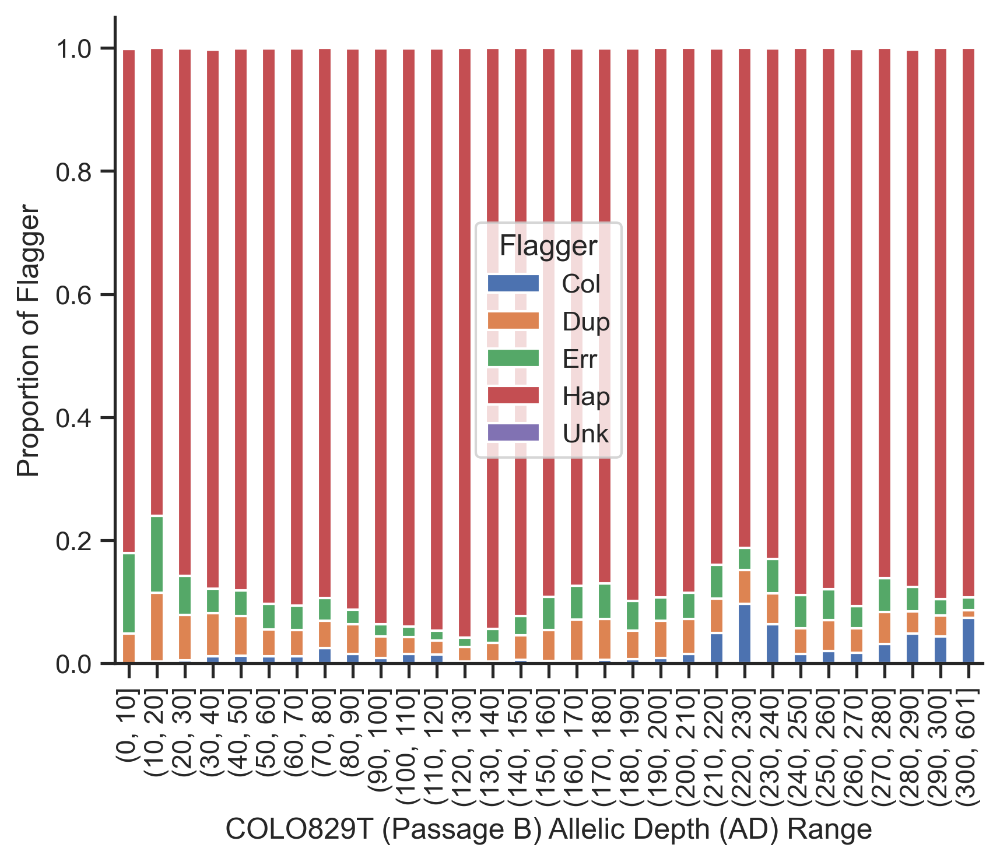

In [146]:
proportion_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Proportion of Flagger')

/tmp/ipykernel_817622/1155899289.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Flagger')

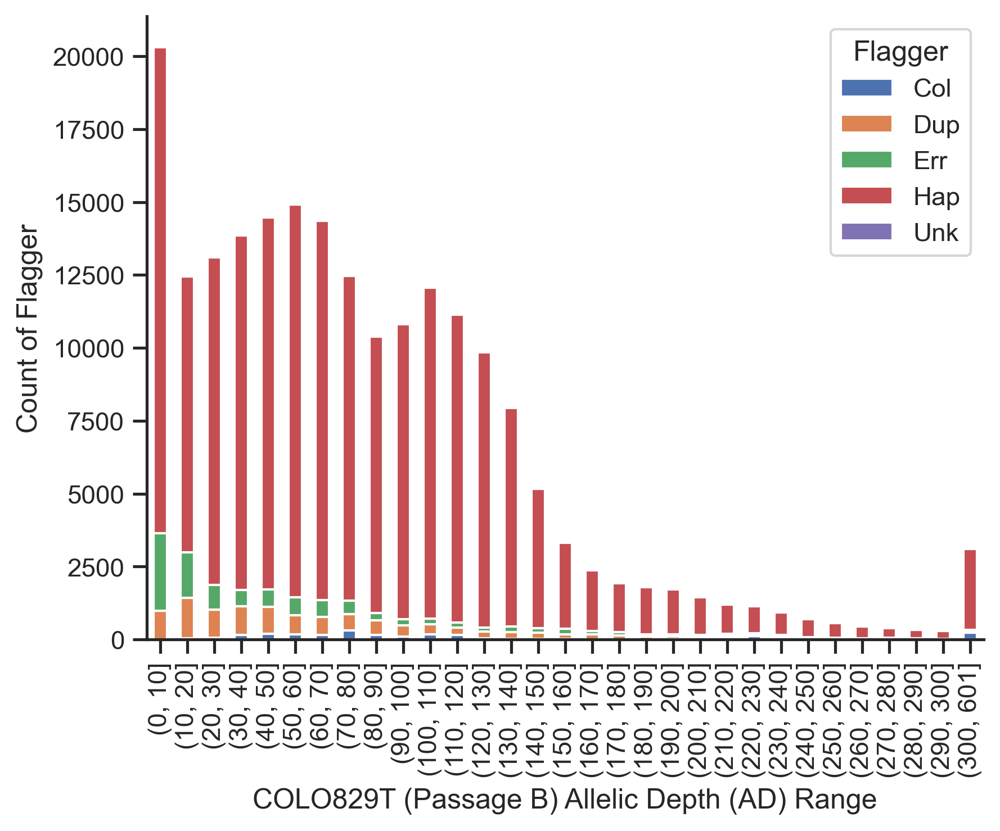

In [147]:
count_df = test1.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Count of Flagger')

In [148]:
test2 = pd.concat([colotb_snvs_pass_annot['SNVid'], colotb_snvs_pass_annot['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), colotb_snvs_pass_annot['Flagger']], axis=1)

bins = list(range(0, 302, 10)) + [test2['COLO829T_PassageB_DSA'].max() + 1]
test2['Range'] = pd.cut(test2['COLO829T_PassageB_DSA'], bins=bins)
test2

,SNVid,COLO829T_PassageB_DSA,Flagger,Range
0,haplotype1-0000001_345669_C_T,133,Hap,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,Hap,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,Hap,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,Hap,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,Hap,"(120, 130]"
...,...,...,...,...
205108,haplotype2-0000194_48714_T_C,20,Dup,"(10, 20]"
205109,haplotype2-0000194_49083_G_C,19,Dup,"(10, 20]"
205110,haplotype2-0000194_52592_A_G,10,Dup,"(0, 10]"
205111,haplotype2-0000194_52823_C_G,10,Dup,"(0, 10]"


/tmp/ipykernel_817622/1099746627.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Flagger')

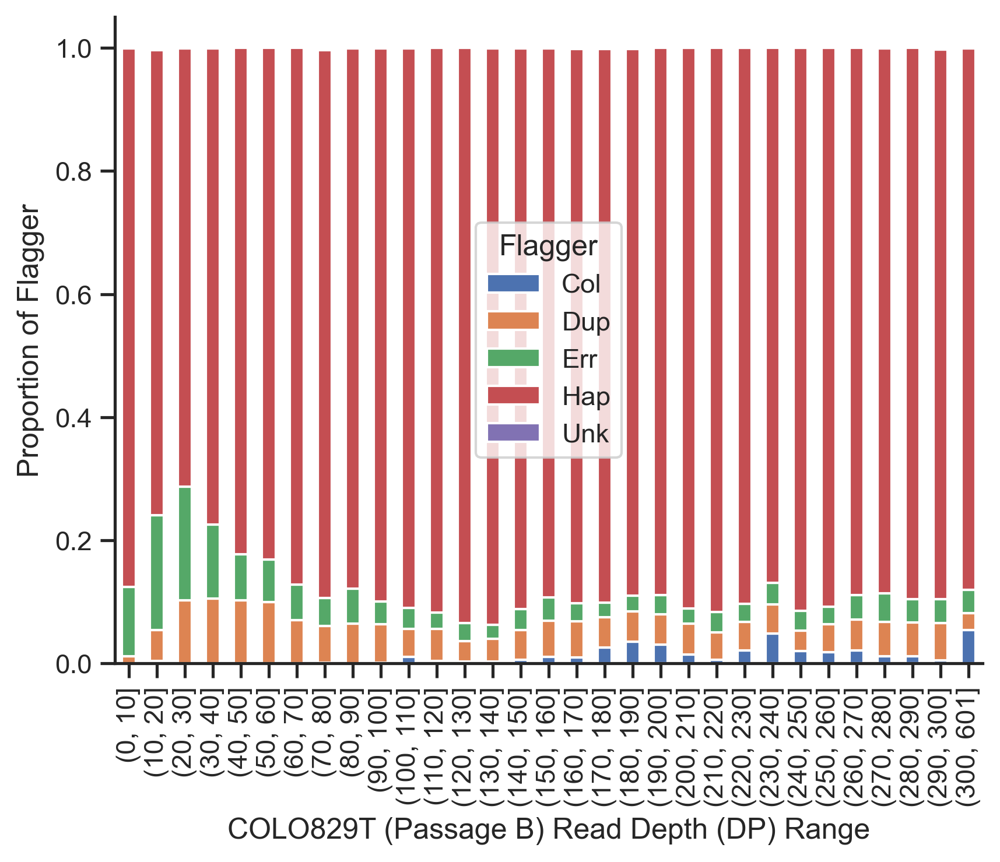

In [149]:
proportion_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Proportion of Flagger')

/tmp/ipykernel_817622/3357046005.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Flagger')

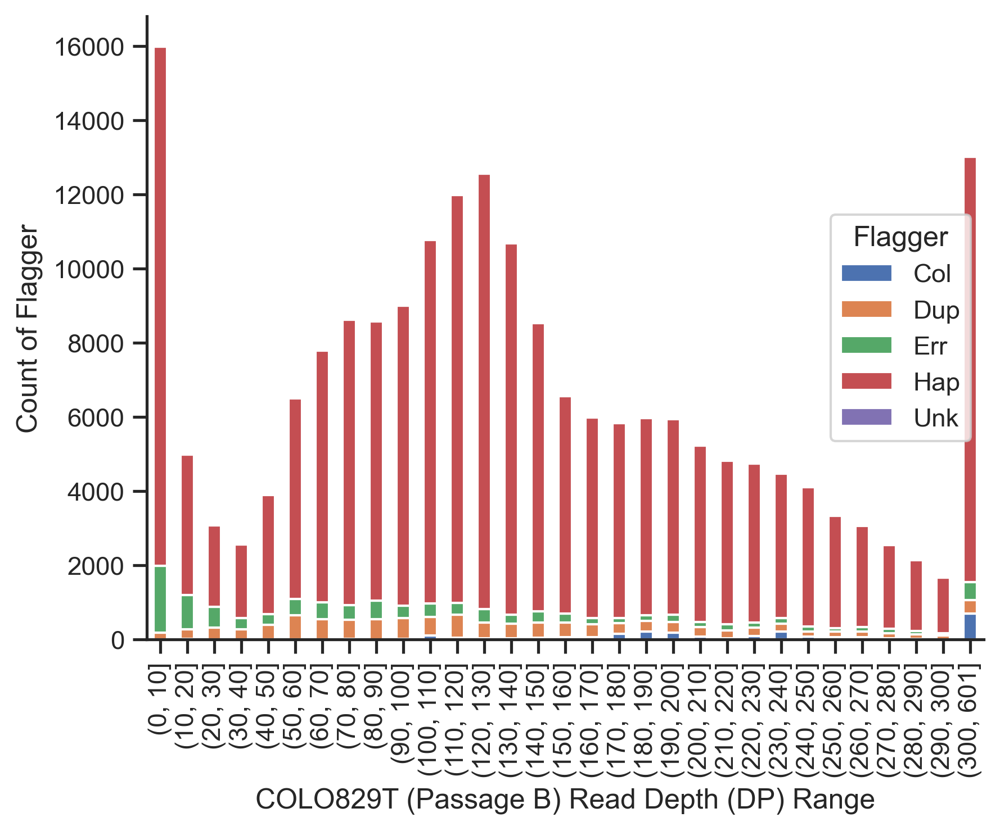

In [150]:
count_df = test2.groupby(['Range', 'Flagger']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Count of Flagger')

In [151]:
# Germline filter (COLOBL AD≥10)
colotb_snvs_pass_annot_FlaggerHap = colotb_snvs_pass_annot[(colotb_snvs_pass_annot['Flagger'] == 'Hap')]
colotb_snvs_pass_annot_FlaggerHap_GlFiltAD10 = colotb_snvs_pass_annot_FlaggerHap[(colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10'] == 'Yes')]

In [152]:
colotb_snvs_pass_annot

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq,COLO829BL_Germline_ad10
0,haplotype1-0000001,345669,.,C,T,65,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:59:133:2,131:0.984962:65,60,0",haplotype1-0000001_345669_C_T,Hap,NaN,No
1,haplotype1-0000001,381602,.,G,T,70.4,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:131:0,131:1:70,66,0",haplotype1-0000001_381602_G_T,Hap,NaN,No
2,haplotype1-0000001,436345,.,G,A,58.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:53:49:0,49:1:58,54,0",haplotype1-0000001_436345_G_A,Hap,NaN,No
3,haplotype1-0000001,493800,.,G,A,68.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:63:83:0,83:1:68,63,0",haplotype1-0000001_493800_G_A,Hap,NaN,No
4,haplotype1-0000001,547974,.,A,G,71.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:65:123:0,123:1:71,66,0",haplotype1-0000001_547974_A_G,Hap,NaN,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205108,haplotype2-0000194,48714,.,T,C,46.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:21:20:0,20:1:46,21,0",haplotype2-0000194_48714_T_C,Dup,NaN,No
205109,haplotype2-0000194,49083,.,G,C,48,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:20:19:0,19:1:47,20,0",haplotype2-0000194_49083_G_C,Dup,NaN,No
205110,haplotype2-0000194,52592,.,A,G,53,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:31:10:0,10:1:52,30,0",haplotype2-0000194_52592_A_G,Dup,NaN,No
205111,haplotype2-0000194,52823,.,C,G,51.3,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:29:10:0,10:1:51,29,0",haplotype2-0000194_52823_C_G,Dup,NaN,No


In [153]:
test3 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[dpindex])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)

bins = list(range(0, 302, 10)) + [test3['COLO829T_PassageB_DSA'].max() + 1]
test3['Range'] = pd.cut(test3['COLO829T_PassageB_DSA'], bins=bins)
test3

,SNVid,COLO829T_PassageB_DSA,COLO829BL_Germline_ad10,Range
0,haplotype1-0000001_345669_C_T,133,No,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,No,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,No,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,No,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,No,"(120, 130]"
...,...,...,...,...
204948,haplotype2-0000190_500_A_G,21,Yes,"(20, 30]"
204949,haplotype2-0000190_535_A_T,21,No,"(20, 30]"
205104,haplotype2-0000194_22585_G_A,61,No,"(60, 70]"
205105,haplotype2-0000194_36807_C_T,60,No,"(50, 60]"


/tmp/ipykernel_817622/1966747824.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Germline Variants (AD≥10)')

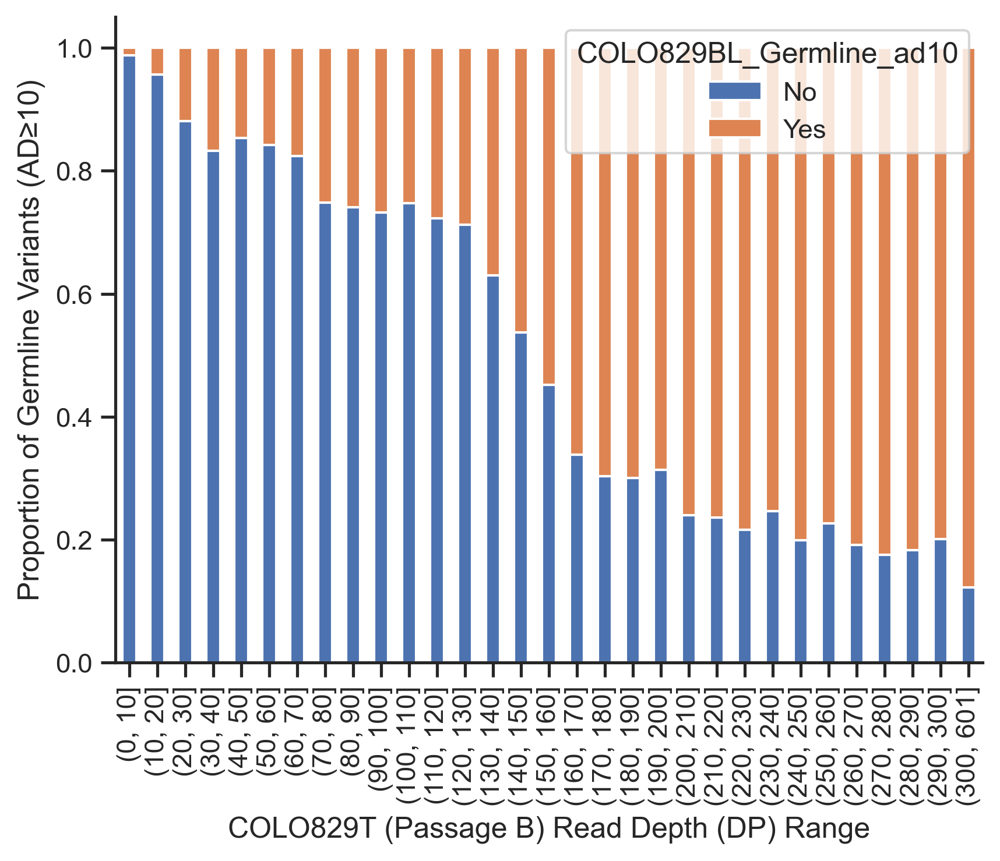

In [154]:
proportion_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Proportion of Germline Variants (AD≥10)')

/tmp/ipykernel_817622/196617426.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Germline Variants (AD≥10)')

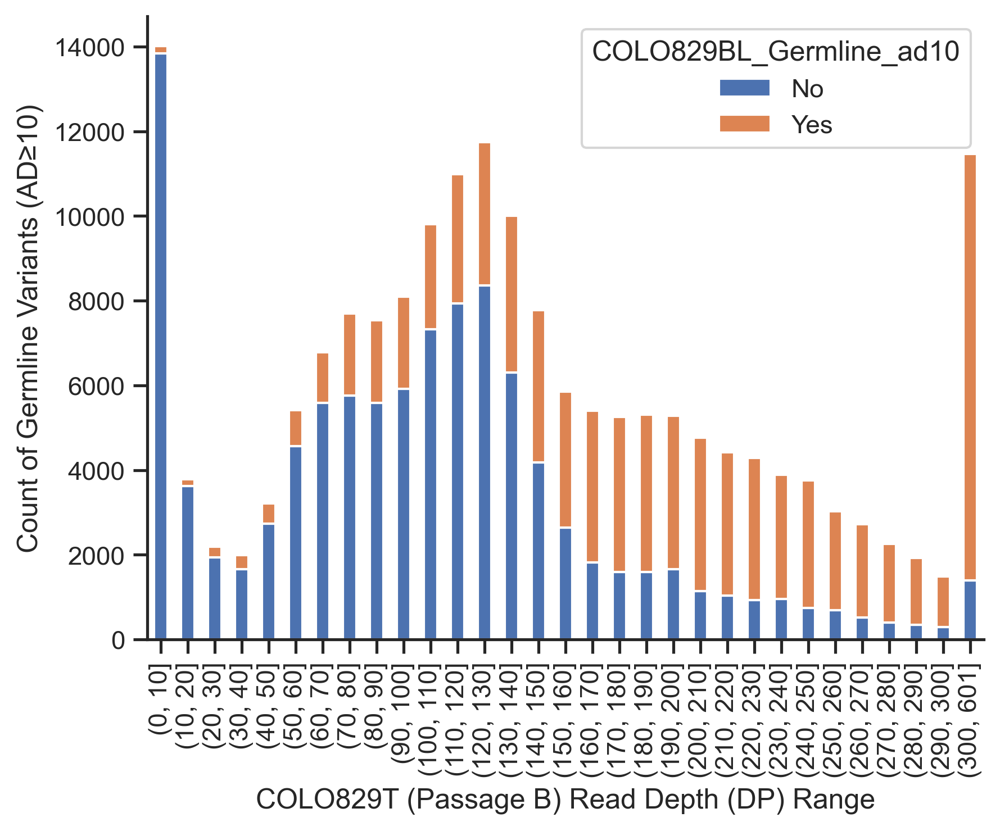

In [155]:
count_df = test3.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Read Depth (DP) Range')
plt.ylabel('Count of Germline Variants (AD≥10)')

In [156]:
test4 = pd.concat([colotb_snvs_pass_annot_FlaggerHap['SNVid'], colotb_snvs_pass_annot_FlaggerHap['COLO829T_PassageB_DSA'].str.split(':').apply(lambda x: int(x[adindex].split(',')[1])), colotb_snvs_pass_annot_FlaggerHap['COLO829BL_Germline_ad10']], axis=1)

bins = list(range(0, 302, 10)) + [test4['COLO829T_PassageB_DSA'].max() + 1]
test4['Range'] = pd.cut(test4['COLO829T_PassageB_DSA'], bins=bins)
test4

,SNVid,COLO829T_PassageB_DSA,COLO829BL_Germline_ad10,Range
0,haplotype1-0000001_345669_C_T,131,No,"(130, 140]"
1,haplotype1-0000001_381602_G_T,131,No,"(130, 140]"
2,haplotype1-0000001_436345_G_A,49,No,"(40, 50]"
3,haplotype1-0000001_493800_G_A,83,No,"(80, 90]"
4,haplotype1-0000001_547974_A_G,123,No,"(120, 130]"
...,...,...,...,...
204948,haplotype2-0000190_500_A_G,11,Yes,"(10, 20]"
204949,haplotype2-0000190_535_A_T,8,No,"(0, 10]"
205104,haplotype2-0000194_22585_G_A,46,No,"(40, 50]"
205105,haplotype2-0000194_36807_C_T,49,No,"(40, 50]"


/tmp/ipykernel_817622/2891568968.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  proportion_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)


Text(0, 0.5, 'Proportion of Germline Variants (AD≥10)')

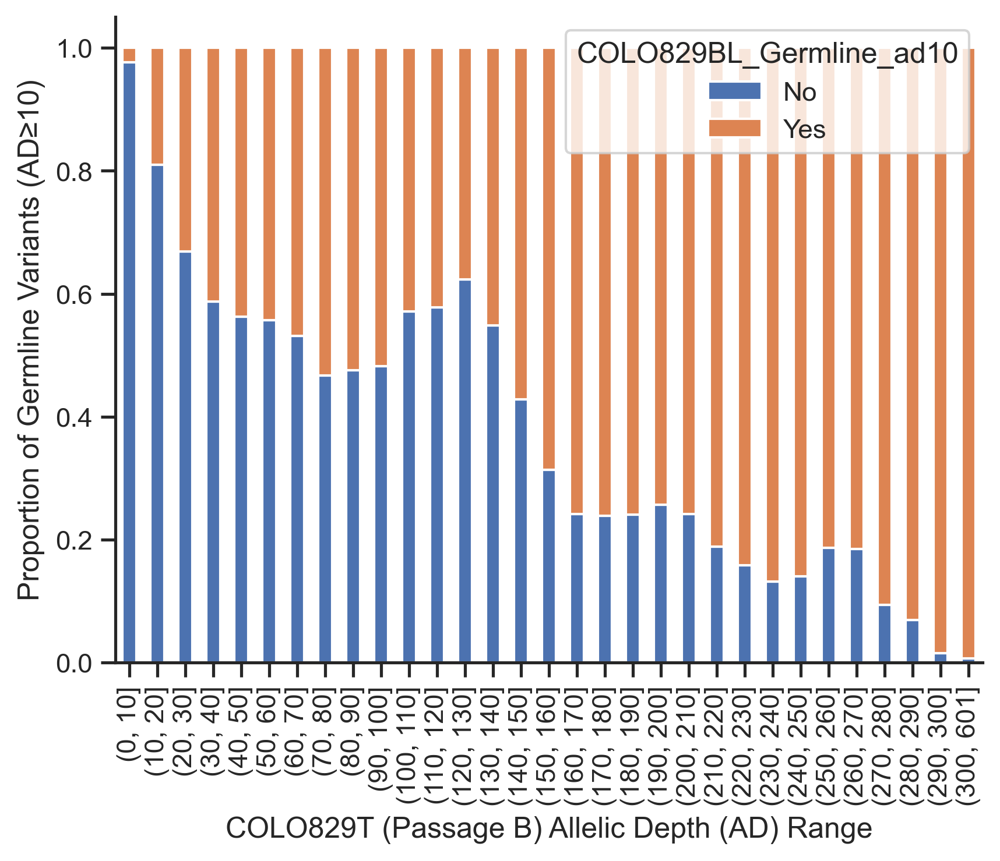

In [157]:
proportion_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
proportion_df = proportion_df.div(proportion_df.sum(axis=1), axis=0)
proportion_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Proportion of Germline Variants (AD≥10)')

/tmp/ipykernel_817622/3261817738.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)


Text(0, 0.5, 'Count of Germline Variants (AD≥10)')

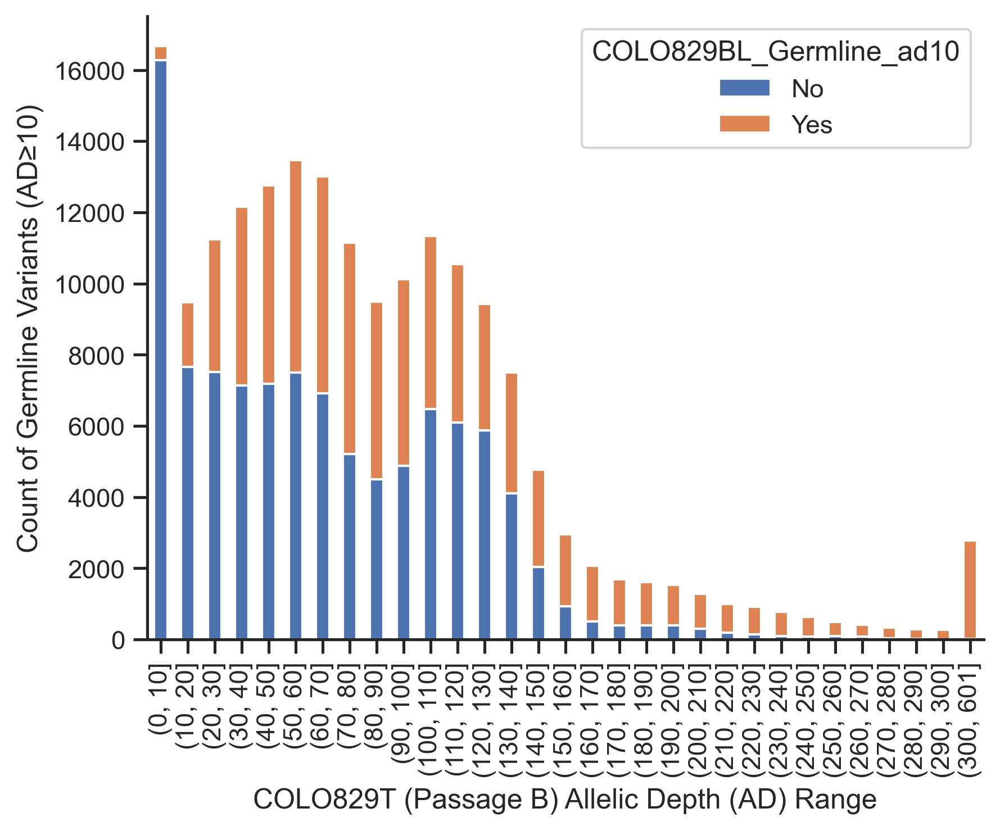

In [158]:
count_df = test4.groupby(['Range', 'COLO829BL_Germline_ad10']).size().unstack(fill_value=0)
count_df.plot(kind='bar', stacked=True)
plt.xlabel('COLO829T (Passage B) Allelic Depth (AD) Range')
plt.ylabel('Count of Germline Variants (AD≥10)')

## Making VCF-based Filtering

In [159]:
colotb_snvs_pass_annot_FlaggerHap_glfilt = colotb_snvs_pass_annot[
    (colotb_snvs_pass_annot['SNVid'].isin(colot_glfilt_set)) & 
    (colotb_snvs_pass_annot['Flagger'] == 'Hap')
    ].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt = colota_snvs_pass_annot[
    (colota_snvs_pass_annot['SNVid'].isin(colot_glfilt_set)) & 
    (colota_snvs_pass_annot['Flagger'] == 'Hap')
    ].reset_index(drop=True)

## Making pileup files using bam-readcount

In [160]:
"""
make_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant', "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")

make_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt, 
               f'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant', "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")
"""

'\nmake_site_list(colotb_snvs_pass_annot_FlaggerHap_glfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant\', "COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")\n\nmake_site_list(colota_snvs_pass_annot_FlaggerHap_glfilt, \n               f\'{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant\', "COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt")\n'

In [161]:
# Time consuming
print(f"cat \
      {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
            | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")

"""
os.system(f"cat \
          {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
          {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
          | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")
"""

cat       /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist             | sort | uniq > /mmfs1/gscratch/stergachislab/mhsohny/SMaHT/Improving_SomaticVariantCalling_through_DSA/Fiber-seq/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup


'\nos.system(f"cat           {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist           {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist           | sort | uniq > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageBA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup")\n'

In [162]:
# Time consuming
"""
os.system(
    f"bam-readcount \
        {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram \
        -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        -f {DSA} \
        > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"
)

os.system(
    f"bam-readcount \
        {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram \
        -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist \
        -f {DSA} \
        > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"
)
"""

'\nos.system(\n    f"bam-readcount         {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram         -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         -f {DSA}         > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"\n)\n\nos.system(\n    f"bam-readcount         {dir}/COLO829BL/COLO829BL_DSA_resetmapq.cram         -l {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.sitelist         -f {DSA}         > {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup"\n)\n'

## Pileup-based Germline Variants Filtering

In [163]:
with open(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup", 'r') as dfh:
    colotb_pileup_snvid_set = set()
    for i in dfh:
        for j in get_pileup_nonref_snvid_from_bamreadcount(i):
            colotb_pileup_snvid_set.add(j)

with open(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.flaggerhap.glfilt.bl.pileup", 'r') as dfh:
    colota_pileup_snvid_set = set()
    for i in dfh:
        for j in get_pileup_nonref_snvid_from_bamreadcount(i):
            colota_pileup_snvid_set.add(j)


In [164]:
print(len(colotb_pileup_snvid_set))
print(len(colota_pileup_snvid_set))

56892
85516


In [165]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt = colotb_snvs_pass_annot_FlaggerHap_glfilt[~colotb_snvs_pass_annot_FlaggerHap_glfilt['SNVid'].isin(colotb_pileup_snvid_set)].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt = colota_snvs_pass_annot_FlaggerHap_glfilt[~colota_snvs_pass_annot_FlaggerHap_glfilt['SNVid'].isin(colota_pileup_snvid_set)].reset_index(drop=True)

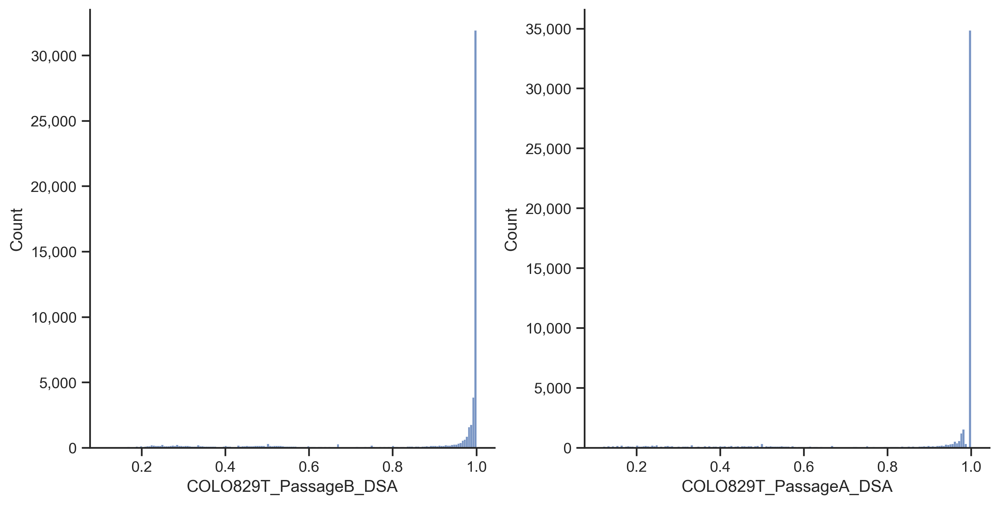

In [166]:
fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

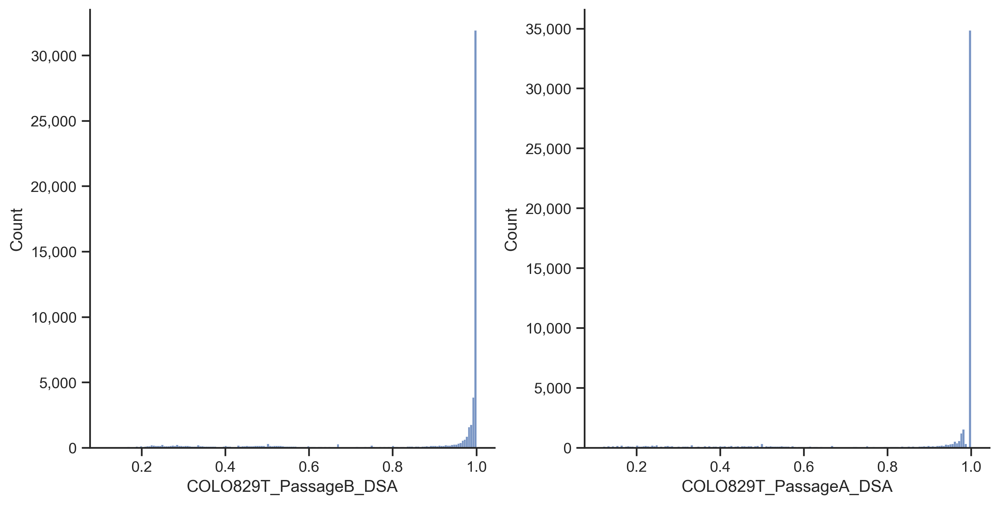

In [167]:
fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF'), 
             kde=False, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

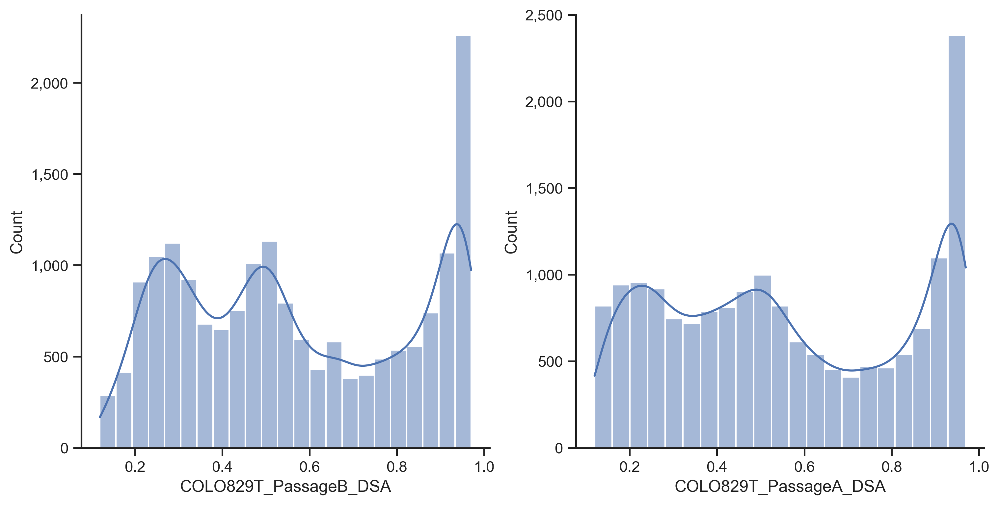

In [168]:
fig, axes = plt.subplots(1,2, figsize=(10,5), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF')[vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF') <= 0.97], 
             kde=True, 
             ax=axes[0])
axes[0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF')[vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt, 'VAF') <= 0.97], 
             kde=True, 
             ax=axes[1])
axes[1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

In [169]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set = set(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].values)
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set = set(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].values)

tba_FlaggerHap_glfilt_pileupfilt_tba_set = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.intersection(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)
tb_FlaggerHap_glfilt_pileupfilt_onlytb_set = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.difference(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)
ta_FlaggerHap_glfilt_pileupfilt_onlyta_set = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.difference(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)

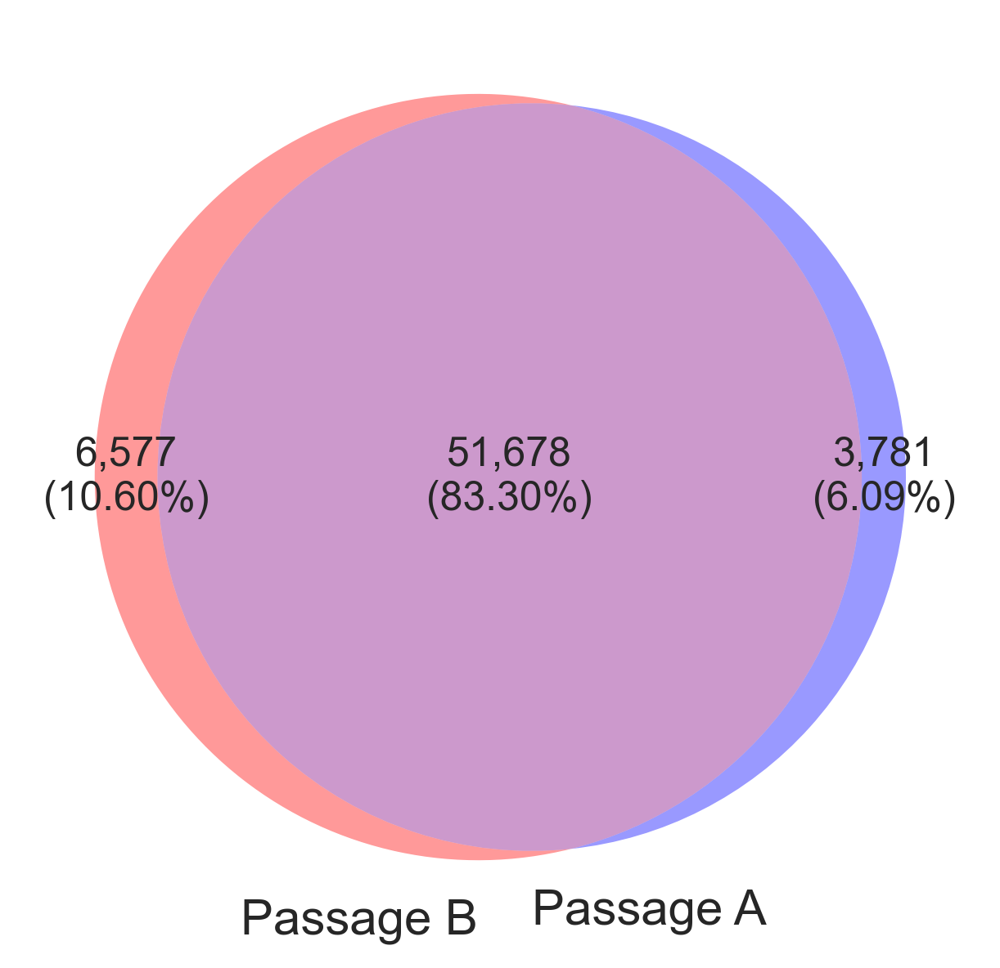

In [170]:



sns.set_theme(font="Arial", font_scale=1.00, style='ticks')
matplotlib.rcParams['figure.dpi'] = 300
plt.rc("axes.spines", top=False, right=False)

total = len((colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set.union(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set)))
venn = venn2([colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set, colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_set], 
             ('Passage B', 'Passage A'),
             subset_label_formatter=lambda x: f"{x:,}\n({(x/total):.2%})")
venn.get_patch_by_id('10').set_color('red')
venn.get_patch_by_id('01').set_color('blue')
venn.get_patch_by_id('11').set_color('purple')

for i in ['10', '01', '11']:
    venn.get_patch_by_id(i).set_edgecolor('none')
    venn.get_patch_by_id(i).set_alpha(0.4)

In [171]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf = vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)], 
    'VAF')

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf = vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)], 
    'VAF')

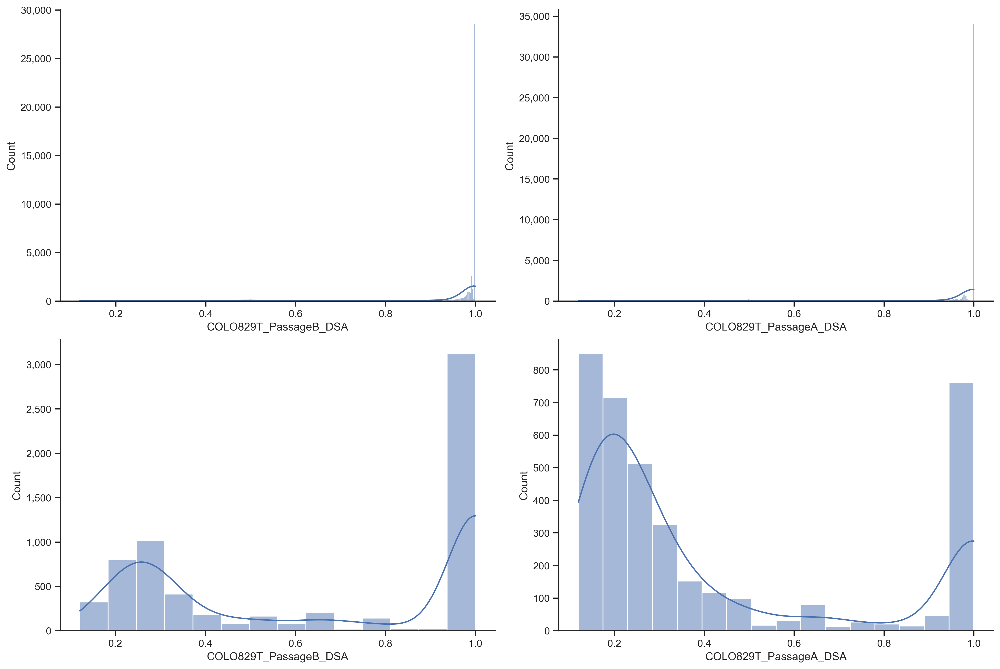

In [172]:
fig, axes = plt.subplots(2,2, figsize=(15,10), constrained_layout=True)
sns.histplot(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf, 
    kde=True, 
    ax=axes[0, 0])
axes[0, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf, 
    kde=True, 
    ax=axes[0, 1])
axes[0, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 0])
axes[1, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(
    vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 1])
axes[1, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


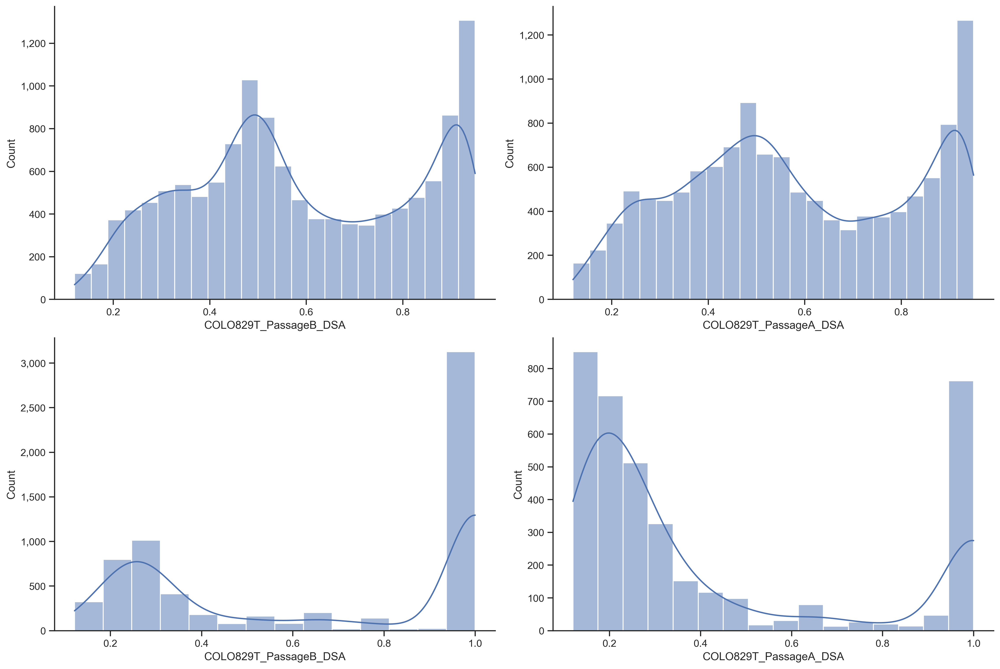

In [173]:
fig, axes = plt.subplots(2,2, figsize=(15,10), constrained_layout=True)
sns.histplot(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_tb_vaf <= 0.95], 
    kde=True, 
    ax=axes[0, 0])
axes[0, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba_ta_vaf <= 0.95], 
    kde=True, 
    ax=axes[0, 1])
axes[0, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.histplot(
    vcf_format_getter(
    colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 0])
axes[1, 0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
sns.histplot(
    vcf_format_getter(
    colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)], 
    'VAF'), 
    kde=True, 
    ax=axes[1, 1])
axes[1, 1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


In [174]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].reset_index(drop=True)

colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].reset_index(drop=True)


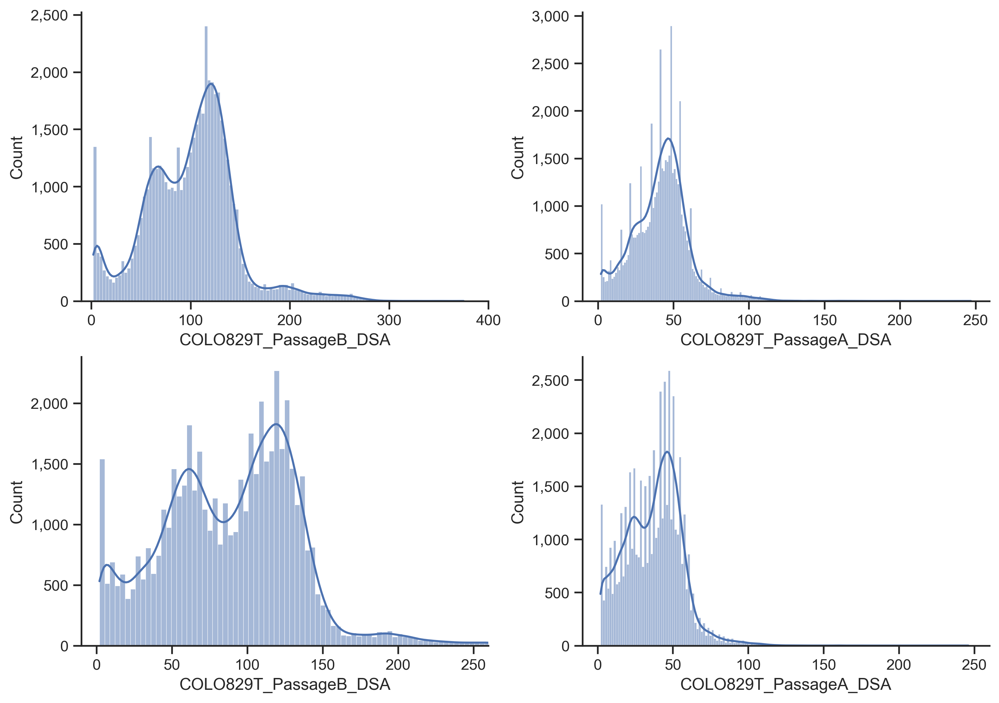

In [175]:
fig, axes = plt.subplots(2,2, figsize=(10,7), constrained_layout=True)
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP"), kde=True, ax=axes[0,0])
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP"), kde=True, ax=axes[0,1])
sns.histplot(vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "AD"), kde=True, ax=axes[1,0])
sns.histplot(vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "AD"), kde=True, ax=axes[1,1])
axes[0,0].set_xlim(-10,400)
axes[1,0].set_xlim(-10,400)
axes[1,0].set_xlim(-10,260)
axes[1,1].set_xlim(-10,260)

axes[0,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[0,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,0].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
axes[1,1].get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))


In [176]:
colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] = vcf_format_getter(colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP")
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] = vcf_format_getter(colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba, "DP")

colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['VCF_DP'] <= 2]

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageB_DSA,SNVid,Flagger,NucFreq,COLO829BL_Germline_ad10,VCF_DP
6468,haplotype1-0000008,50005219,.,C,A,36.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:6:2:0,2:1:34,5,0",haplotype1-0000008_50005219_C_A,Hap,NaN,No,2
6476,haplotype1-0000008,57187004,.,G,A,34.1,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:33,5,0",haplotype1-0000008_57187004_G_A,Hap,NaN,No,2
21482,haplotype1-0000021,36436739,.,G,C,30,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:8:2:0,2:1:29,6,0",haplotype1-0000021_36436739_G_C,Hap,NaN,No,2
21483,haplotype1-0000021,36436743,.,G,T,30.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:29,6,0",haplotype1-0000021_36436743_G_T,Hap,NaN,No,2
21484,haplotype1-0000021,36436764,.,A,G,30.6,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:29,6,0",haplotype1-0000021_36436764_A_G,Hap,NaN,No,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46667,haplotype2-0000073,79674169,.,G,A,34.7,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:33,5,0",haplotype2-0000073_79674169_G_A,Hap,NaN,No,2
46671,haplotype2-0000073,79821404,.,G,A,29.6,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:28,6,0",haplotype2-0000073_79821404_G_A,Hap,NaN,No,2
46672,haplotype2-0000073,79821405,.,G,A,24.5,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:23,6,0",haplotype2-0000073_79821405_G_A,Hap,NaN,No,2
46673,haplotype2-0000073,79827179,.,C,A,36.8,PASS,.,GT:GQ:DP:AD:VAF:PL,"1/1:7:2:0,2:1:35,5,0",haplotype2-0000073_79827179_C_A,Hap,NaN,No,2


In [177]:
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['SNVid'] == 'haplotype1-0000021_36436739_G_C']
colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt_tba['SNVid'] == 'haplotype1-0000021_36436743_G_T']

,CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,COLO829T_PassageA_DSA,SNVid,Flagger,NucFreq,VCF_DP
21483,haplotype1-0000021,36436743,.,G,T,33.9,PASS,.,GT:GQ:DP:AD:VAF:PL,"0/1:24:6:1,5:0.833333:33,0,24",haplotype1-0000021_36436743_G_T,Hap,NaN,6


## Making VCF

In [190]:
# tb all
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.vcf.gz")


512

In [191]:
# ta all
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt.iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.vcf.gz")

512

In [192]:
# TBA tb
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.tba.vcf.gz")

# TBA ta
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tba_FlaggerHap_glfilt_pileupfilt_tba_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.tba.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.tba.vcf.gz")

512

In [193]:
# Only tb
pre_vcf = colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colotb_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(tb_FlaggerHap_glfilt_pileupfilt_onlytb_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.onlytb.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageB_DSA/deepvariant/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.prefinal.onlytb.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageB_DSA.deepvariant.split.snv.modified.final.onlytb.vcf.gz")

512

In [194]:
# Only ta
pre_vcf = colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt[colota_snvs_pass_annot_FlaggerHap_glfilt_pileupfilt['SNVid'].isin(ta_FlaggerHap_glfilt_pileupfilt_onlyta_set)].iloc[:, :10].rename(columns={"CHROM": "#CHROM"})
pre_vcf.to_csv(f"{dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.onlyta.vcf", sep='\t', index=False)

os.system(f"cat {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/pseudovcf_header {dir}/VariantCalls_DeepVariant_1.6.1/COLO829T_PassageA_DSA/deepvariant/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.prefinal.onlyta.vcf > {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf")

os.system(f"bgzip {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf && tabix -p vcf {dir}/VariantCalls_DeepVariant_1.6.1/Mutational_Spectrum/COLO829T_PassageA_DSA.deepvariant.split.snv.modified.final.onlyta.vcf.gz")

512